## Retrieving the Data from the web
Only run this on Terminal..see Instruction in the fourth cell

In [ ]:
# I went to my windows terminal to run these
(Invoke-WebRequest "https://www.ebi.ac.uk/biostudies/api/v1/studies/E-MTAB-6701/info").Content | Select-String ftpLink
#then I type y and ran the code

In [ ]:
#then copied the link from it into some part of this next code
#this is to download the raw data
curl.exe -L -C - -o raw_data_10x.txt "https://ftp.ebi.ac.uk/biostudies/fire/E-MTAB-/701/E-MTAB-6701/Files/raw_data_10x.txt"


In [ ]:
#this is to download other data avaible on the webiste or i can just download that from their website because teh size is small
curl.exe -L -C - -o meta_10x.txt "https://ftp.ebi.ac.uk/biostudies/fire/E-MTAB-/701/E-MTAB-6701/Files/meta_10x.txt"
curl.exe -L -C - -o E-MTAB-6701.idf.txt "https://ftp.ebi.ac.uk/biostudies/fire/E-MTAB-/701/E-MTAB-6701/Files/E-MTAB-6701.idf.txt"
curl.exe -L -C - -o E-MTAB-6701.sdrf.txt "https://ftp.ebi.ac.uk/biostudies/fire/E-MTAB-/701/E-MTAB-6701/Files/E-MTAB-6701.sdrf.txt"


In [ ]:
#the problem is I wont be able to use these files on jupyter becausse they are on my window.. 
#Go to the libary where the notebook I am using to run the analysis on my Jupyter
#I had to click the blue + like i want to open a new notebook and opened Terminal
#then i ran this
curl -L -C - -o raw_data_10x.txt "https://ftp.ebi.ac.uk/biostudies/fire/E-MTAB-/701/E-MTAB-6701/Files/raw_data_10x.txt"
curl -L -C - -o meta_10x.txt "https://ftp.ebi.ac.uk/biostudies/fire/E-MTAB-/701/E-MTAB-6701/Files/meta_10x.txt"
curl -L -C - -o E-MTAB-6701.idf.txt "https://ftp.ebi.ac.uk/biostudies/fire/E-MTAB-/701/E-MTAB-6701/Files/E-MTAB-6701.idf.txt"
curl -L -C - -o E-MTAB-6701.sdrf.txt "https://ftp.ebi.ac.uk/biostudies/fire/E-MTAB-/701/E-MTAB-6701/Files/E-MTAB-6701.sdrf.txt"

## What each data from their repository mean?

## Sample ID description

## Make downloaded data ready (.h5ad) for processing

In [1]:
#Load packages
import scanpy as sc
import pandas as pd
import numpy as np
import platform, os
import scipy.sparse as sp
import anndata as ad

In [2]:
#Set my file path
from pathlib import Path

raw_path = Path("/home/jemima/Secondyear/Secondyear_notes/raw_data_10x.txt")
meta_path = Path("/home/jemima/Secondyear/Secondyear_notes/meta_10x.txt")
print(raw_path.exists(), meta_path.exists())

True True


In [3]:
# Inspect data and checking the first line
with raw_path.open("r") as f:
    first_line = f.readline().rstrip("\n")
print("First line (first 200 chars):", first_line[:200])
print("First line column count (tab-split):", len(first_line.split("\t")))

First line (first 200 chars): Gene	FCA7167222_TCTGGAACAGAGTGTG	FCA7167226_GGAACTTGTCTAAACC	FCA7196225_ACTATCTCATTCACTT	FCA7474063_AAAGCAAGTCAAACTC	FCA7196219_CTCGAAAGTTAAGTAG	FCA7511882_ACACCAATCGCCAGCA	FCA7167226_AGACGTTAGTCAAGCG
First line column count (tab-split): 64735


In [4]:
# 1) Read header to get cell IDs in order
cols = pd.read_csv(raw_path, sep="\t", nrows=0).columns.tolist()
assert cols[0] == "Gene"
cell_ids = cols[1:]
print("Cells in raw header:", len(cell_ids))

Cells in raw header: 64734


In [5]:
# 2) Read metadata
meta = pd.read_csv(meta_path, sep="\t", index_col=0)
print("Cells in meta:", meta.shape[0])

# Reindex to match raw column order (missing cells become NA rows)
obs = meta.reindex(cell_ids)  # aligns rows to match raw cell order
missing = obs.index[obs.isna().all(axis=1)]
print("Cells missing from meta:", len(missing))

Cells in meta: 64734
Cells missing from meta: 0


In [6]:
#3) Chunk-read the matrix (genes x cells)
Xs = []
gene_names = []

# Choose chunksize based on RAM; 200–500 is usually safe.
chunksize = 200

In [7]:
#4) read so that I can sparse
reader = pd.read_csv(raw_path, sep="\t", chunksize=chunksize)

for i, chunk in enumerate(reader, start=1):
    genes = chunk.iloc[:, 0].astype(str).tolist()
    gene_names.extend(genes)

    # counts block: genes x cells (dense chunk), then convert to sparse
    counts = chunk.iloc[:, 1:].to_numpy(dtype=np.int32, copy=False)
    Xs.append(sp.csr_matrix(counts))

    if i % 10 == 0:
        print(f"Processed {i*chunksize} genes...")

Processed 2000 genes...
Processed 4000 genes...
Processed 6000 genes...
Processed 8000 genes...
Processed 10000 genes...
Processed 12000 genes...
Processed 14000 genes...
Processed 16000 genes...
Processed 18000 genes...
Processed 20000 genes...
Processed 22000 genes...
Processed 24000 genes...
Processed 26000 genes...
Processed 28000 genes...
Processed 30000 genes...


In [8]:
#5) Build the full matrix as genes × cells (because that’s how the file is organized)
X_genes_by_cells = sp.vstack(Xs, format="csr")    
#Xs is a list like: [X_chunk1, X_chunk2, X_chunk3, ...]. Each chunk contains different genes, but the same cell columns.
#sp.vstack(...) means “stack these matrices vertically” (row-wise).

#6)then using the .T function to transpose it to cells × genes (because that’s how Scanpy works).
X_cells_by_genes = X_genes_by_cells.T.tocsr()      #.tocsr() ensures the transposed matrix is stored in CSR sparse format, which is efficient for slicing rows and Scanpy

print("Final matrix shape (cells x genes):", X_cells_by_genes.shape)

Final matrix shape (cells x genes): (64734, 31764)


In [9]:
#7) Build AnnData object
var = pd.DataFrame(index=pd.Index(gene_names, name="gene"))
adata = ad.AnnData(X=X_cells_by_genes, obs=obs, var=var)

In [10]:
adata.obs.head()

,Fetus,location,final_cluster,annotation
FCA7167222_TCTGGAACAGAGTGTG,D7,Decidua,0,dS1
FCA7167226_GGAACTTGTCTAAACC,D7,Decidua,0,dS1
FCA7196225_ACTATCTCATTCACTT,D9,Decidua,0,dS1
FCA7474063_AAAGCAAGTCAAACTC,D10,Decidua,0,dS1
FCA7196219_CTCGAAAGTTAAGTAG,D8,Decidua,0,dS1


In [11]:
adata.var.head()

""
gene
TNMD_ENSG00000000005
DPM1_ENSG00000000419
SCYL3_ENSG00000000457
C1orf112_ENSG00000000460
FGR_ENSG00000000938


In [12]:
# My file had gene strings like: FGR_ENSG00000000938
#8) CLEAN: split the gene string into Gene + Accession because i had problem with marker genes the first time
v = adata.var_names.to_series().astype(str)

adata.var["Accession"] = v.str.extract(r"(ENSG\d+)")[0]
adata.var["Gene"]      = v.str.replace(r"_ENSG\d+$", "", regex=True)

# safety for any rows that do not match ENSG pattern
mask = adata.var["Accession"].isna()
adata.var.loc[mask, "Accession"] = v[mask].values
adata.var.loc[mask, "Gene"]      = v[mask].values

# Use Gene as the actual var_names. THIS makes var table index = Gene
adata.var_names = adata.var["Gene"].astype(str)
adata.var_names_make_unique()          # prevents duplicate-symbol crashes (RGS5, RGS5-1, etc.)
adata.var.index.name = "Gene"


In [13]:
# check after the split + setting var_names
adata.var.head()
print("Example var_names:", adata.var_names[:3].tolist())
print("Duplicate var_names:", adata.var_names.duplicated().sum())

Example var_names: ['TNMD', 'DPM1', 'SCYL3']
Duplicate var_names: 0


In [14]:
adata.var.head()

,Accession,Gene
Gene,,
TNMD,ENSG00000000005,TNMD
DPM1,ENSG00000000419,DPM1
SCYL3,ENSG00000000457,SCYL3
C1orf112,ENSG00000000460,C1orf112
FGR,ENSG00000000938,FGR


In [15]:
# Drop the redundant Gene column
adata.var.drop(columns=["Gene"], inplace=True)

In [16]:
adata.var.head()

,Accession
Gene,
TNMD,ENSG00000000005
DPM1,ENSG00000000419
SCYL3,ENSG00000000457
C1orf112,ENSG00000000460
FGR,ENSG00000000938


In [17]:
#9) keep a raw counts copy as a layer before I start preprocessing
adata.layers["counts"] = adata.X.copy()

In [18]:
#9)save the output
adata.write_h5ad("1.2_VentoTormo_E-MTAB-6701_counts.h5ad", compression="gzip")

In [19]:
print(adata)

AnnData object with n_obs × n_vars = 64734 × 31764
    obs: 'Fetus', 'location', 'final_cluster', 'annotation'
    var: 'Accession'
    layers: 'counts'


## Checking Martyna's Vento Tormo Version

In [26]:
MartynaVT = sc.read_loom('/home/jemima/my_rds_mount/processed_data/Vento_tormo_martyna_final.loom')

/home/jemima/miniconda3/envs/scanpy_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [32]:
print(MartynaVT)

AnnData object with n_obs × n_vars = 39311 × 36601
    obs: 'Author', 'Comment[BioSD_SAMPLE]', 'Factor Value[organism part]', 'Source Name', 'SourceName'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'


In [33]:
print(MartynaVT.obs.head())

                                        Author Comment[BioSD_SAMPLE]  \
CellID                                                                 
FCA7511885:AACGTTGTCATGTCCCx  Vento-Tormo_2018          SAMEA4837774   
FCA7511885:AAAGTAGTCAAGAAGTx  Vento-Tormo_2018          SAMEA4837774   
FCA7511885:AAAGCAATCATCGGATx  Vento-Tormo_2018          SAMEA4837774   
FCA7511885:AACTCAGCAGGTGCCTx  Vento-Tormo_2018          SAMEA4837774   
FCA7511885:AACGTTGGTCAGAATAx  Vento-Tormo_2018          SAMEA4837774   

                             Factor Value[organism part] Source Name  \
CellID                                                                 
FCA7511885:AACGTTGTCATGTCCCx                    placenta  FCA7511885   
FCA7511885:AAAGTAGTCAAGAAGTx                    placenta  FCA7511885   
FCA7511885:AAAGCAATCATCGGATx                    placenta  FCA7511885   
FCA7511885:AACTCAGCAGGTGCCTx                    placenta  FCA7511885   
FCA7511885:AACGTTGGTCAGAATAx                    placenta  FCA75

In [34]:
print(MartynaVT.var.head())

                  Accession  Chromosome     End   Start Strand
Gene                                                          
BX004987.1  ENSG00000278704  GL000009.2   58376   56140      -
AC145212.1  ENSG00000277400  GL000194.1  115018   53590      -
MAFIP       ENSG00000274847  GL000194.1  115055   53594      -
AC011043.1  ENSG00000276256  GL000195.1   49164   42939      -
AC011043.2  ENSG00000278198  GL000195.1  179372  173872      +


## Scanpy Preprocessing steps

In [1]:
#Load packages
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
#load h5ad data file, reme
adata = sc.read_h5ad("1.2_VentoTormo_E-MTAB-6701_counts.h5ad")

In [3]:
adata

AnnData object with n_obs × n_vars = 64734 × 31764
    obs: 'Fetus', 'location', 'final_cluster', 'annotation'
    var: 'Accession'
    layers: 'counts'

### Quality control

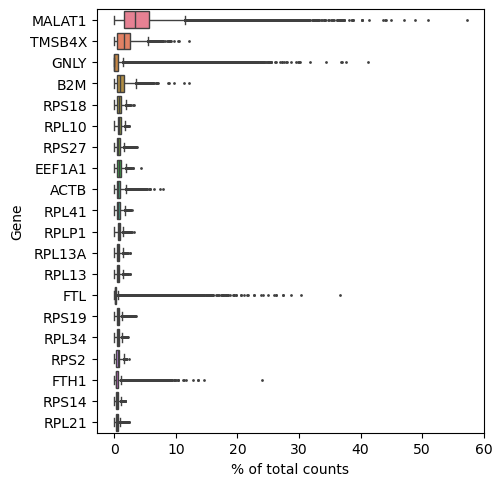

In [4]:
#Show those genes that yield the highest fraction of counts in each single cell, across all cells.
sc.pl.highest_expr_genes(adata, n_top=20)

In [5]:
#Basic Filtering 200 by 3
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

In [6]:
print("Cells:", adata.n_obs)
print("Genes:", adata.n_vars)
#so it didnt filter any cells out so i will continue

Cells: 64734
Genes: 26212


In [7]:
# Create QC flags
gs = adata.var_names.astype(str)
# mitochondrial genes, "MT-" for human,
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# mitochondrial genes, "Mt-" for mouse
adata.var["Mt"] = adata.var_names.str.startswith("Mt-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

In [8]:
#Calaculte mitochondrial, ribosomal and hemoglobin genes)
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "Mt", "ribo", "hb"], percent_top=None, log1p=False, inplace=True)

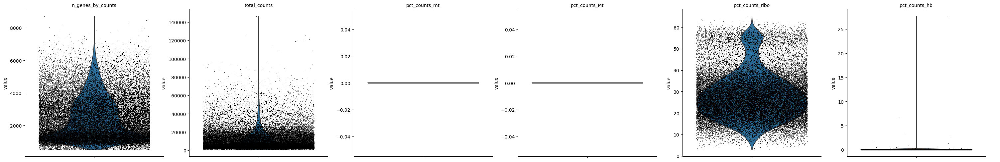

In [9]:
#Inspect the QC metrics
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_Mt", "pct_counts_ribo", "pct_counts_hb"],
    jitter=0.4,
    multi_panel=True,
)

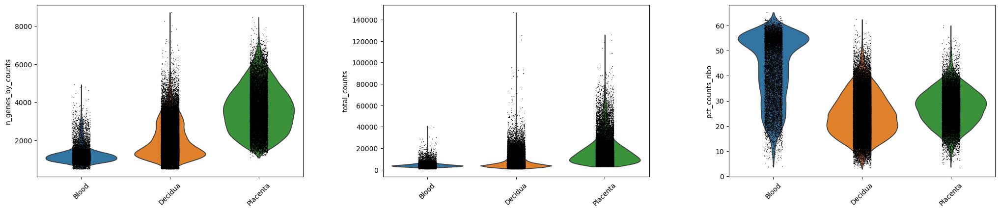

In [10]:
#look at plot by tissue
sc.pl.violin(
    adata,
    ["n_genes_by_counts","total_counts","pct_counts_ribo"],
    groupby="location",
    rotation=45,
    multi_panel=True
)

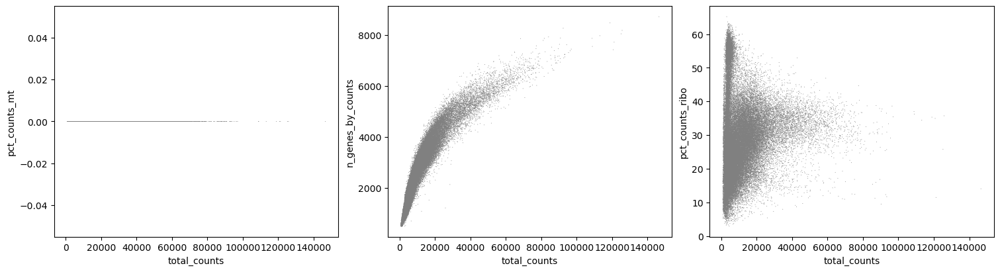

In [11]:
#Inspect cell to Remove cells that have too many mitochondrial genes expressed or too many total counts:
fig, axs = plt.subplots(1, 3, figsize=(15, 4), layout="constrained")
sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt", show=False, ax=axs[0])
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts", show=False, ax=axs[1])
sc.pl.scatter(adata, x="total_counts", y="pct_counts_ribo", show=False, ax=axs[2]);

In [12]:
# Filter based on the outputs form my plots
adata = adata[adata.obs.pct_counts_mt <5, :]
adata = adata[adata.obs.n_genes_by_counts < 7000, :] # keep cells with < 7000 total genes based on violin plot and bottom of two graphs above

In [13]:
adata

View of AnnData object with n_obs × n_vars = 64666 × 26212
    obs: 'Fetus', 'location', 'final_cluster', 'annotation', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'Accession', 'n_cells', 'mt', 'Mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'location_colors'
    layers: 'counts'

### Normalisation and Log transform

In [14]:
#checking if X is rawcount
x = adata.X[:5, :5]
x = x.A if hasattr(x, "A") else np.array(x)
x

array(<Compressed Sparse Row sparse matrix of dtype 'int32'
	with 3 stored elements and shape (5, 5)>, dtype=object)

In [15]:
# I have confimred that X is still raw counts, so I can run this
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

/home/jemima/miniconda3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:216: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [16]:
#Save a “raw” copy for later marker plots or for marker. It should be done after normalize_total + log1p, and before I subset to HVGs:
adata.raw = adata

### Calculating HVGs and Subsetting HVGs for PCA/UMAP. 
Even if PCA is based on HVGs, you can still visualise and test genes that are not HVGs, as long as you preserved the full gene matrix (usually in adata.raw or by keeping an un-subsetted copy).
adata as full genes; use adata_hvg for PCA/UMAP.

In [ ]:
#make sure i have run to code to copy adata before subsetting. it is in the last line of code in the normalisation section.
#check that I have ran the code if not run the code, it is this code below, just remove the hashtag and run
#adata.raw=adata

In [17]:
#Identify highly-variable genes using seurat from scanpy tutorials
sc.pp.highly_variable_genes(adata, min_mean=0.0125,max_mean=3, min_disp=0.5, flavor="seurat_v3",)

/home/jemima/miniconda3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:73: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


In [18]:
#Chcek how many highly variable genes (HVGs) I have got
adata.var["highly_variable"].sum()

2000

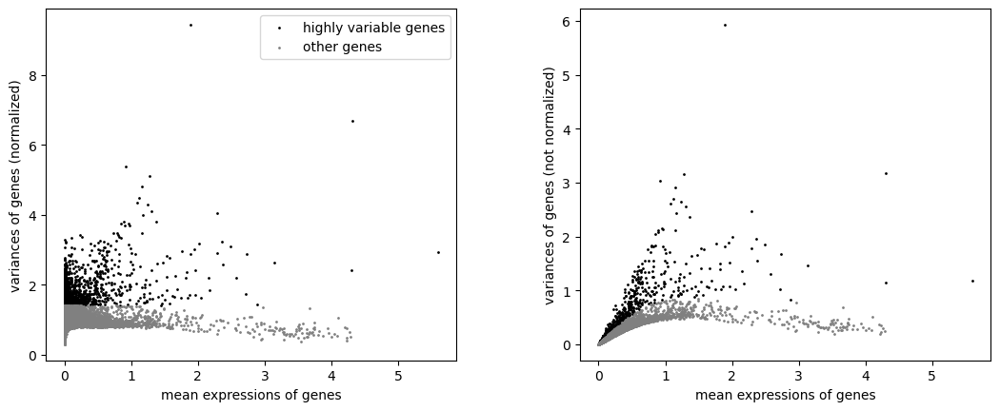

In [19]:
sc.pl.highly_variable_genes(adata)

In [20]:
#Identify highly-variable genes using cell ranger
sc.pp.highly_variable_genes(adata, min_mean=0.0125,max_mean=3, min_disp=0.5, flavor="cell_ranger",)

In [21]:
#Chcek how many highly variable genes (HVGs) I have got
adata.var["highly_variable"].sum()

4252

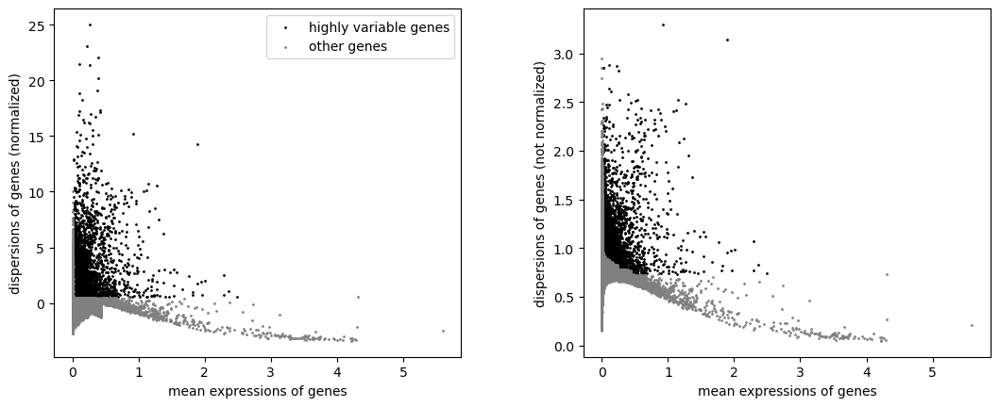

In [22]:
sc.pl.highly_variable_genes(adata)

In [23]:
adata

AnnData object with n_obs × n_vars = 64666 × 26212
    obs: 'Fetus', 'location', 'final_cluster', 'annotation', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'Accession', 'n_cells', 'mt', 'Mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'dispersions', 'dispersions_norm'
    uns: 'location_colors', 'log1p', 'hvg'
    layers: 'counts'

In [26]:
#Create a new object to Subset to HVGs for PCA/UMAP
adata_hvg = adata[:, adata.var["highly_variable"]].copy() #.copy() → makes a full AnnData object

In [28]:
adata_hvg

AnnData object with n_obs × n_vars = 64666 × 4252
    obs: 'Fetus', 'location', 'final_cluster', 'annotation', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'Accession', 'n_cells', 'mt', 'Mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'dispersions', 'dispersions_norm'
    uns: 'location_colors', 'log1p', 'hvg'
    layers: 'counts'

In [29]:
adata

AnnData object with n_obs × n_vars = 64666 × 26212
    obs: 'Fetus', 'location', 'final_cluster', 'annotation', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'Accession', 'n_cells', 'mt', 'Mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'dispersions', 'dispersions_norm'
    uns: 'location_colors', 'log1p', 'hvg'
    layers: 'counts'

### Scale + PCA 

In [30]:
#scale
sc.pp.scale(adata_hvg, max_value=10)

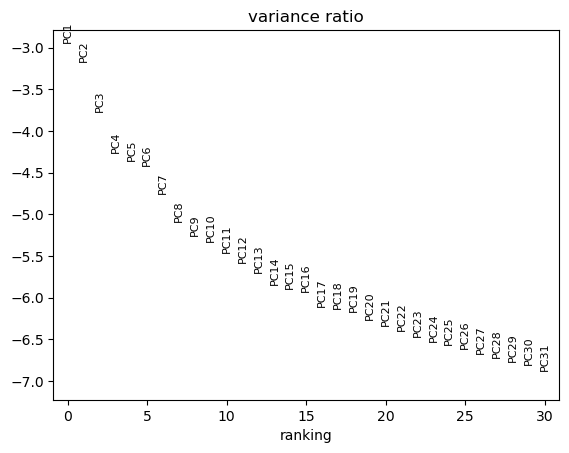

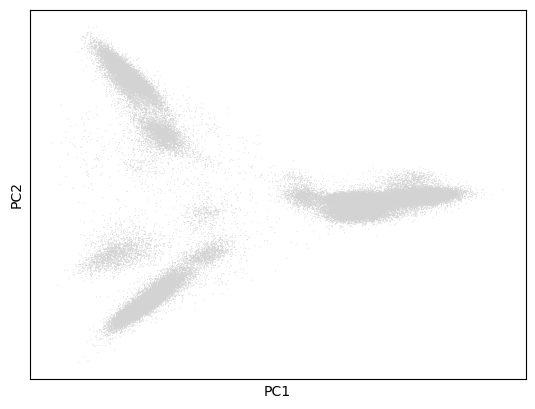

In [31]:
#calculate and plot PCA
sc.tl.pca(adata_hvg, svd_solver="arpack")
sc.pl.pca_variance_ratio(adata_hvg, log=True)
sc.pl.pca(adata_hvg)

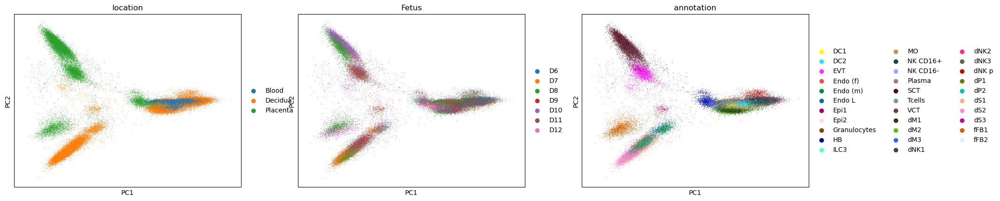

In [32]:
#Colour pca by metadata to understand what the separation is
sc.pl.pca(adata_hvg, color=["location", "Fetus", "annotation"])

### Computing neighborhood graph/ Plotting UMPA
n_pcs: how many PCA dimensions are used to compute distances between cells. PCA turns your gene expression into PCs (PC1, PC2, …).

n_pcs=20 means “use the first 20 PCs to measure similarity”.

Effect:
- Too few PCs → you might miss real biology (underfit).
- Too many PCs → you may include noise (overfit), and distances can get messier.

n_neighbors: how many nearest neighbours each cell connects to in the kNN graph. After distances are computed (in PC space), Scanpy builds a graph.

n_neighbors=30 means “each cell connects to its 30 closest cells”.

Effect:
- Smaller n_neighbors → more local detail, more small clusters, can be noisy.
- Larger n_neighbors → smoother graph, broader clusters, can blur rare cell types.

In [33]:
#Calculate k nearest neighbors.
#From Meg = A good rule of thumb is to have the n be close to the square root of your sample size, but >100 doesn't make much difference
#Based on my data
#√64,666 is about 254 (because 254² = 64,516 and 255² = 65,025). Rule-of-thumb: ~254 bins
#but i want to start with 100 to see
sc.pp.neighbors(adata_hvg, n_neighbors=100, n_pcs=30)

/home/jemima/miniconda3/envs/scanpy_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [34]:
sc.tl.umap(adata_hvg)

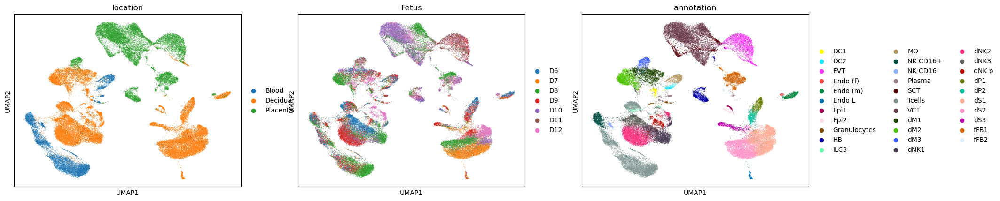

In [35]:
sc.pl.umap(adata_hvg, color=["location", "Fetus", "annotation"])

In [37]:
#re-run nearest neighbour graph based on scanpy values
sc.pp.neighbors(adata_hvg, n_neighbors=30, n_pcs=30)
sc.tl.umap(adata_hvg)

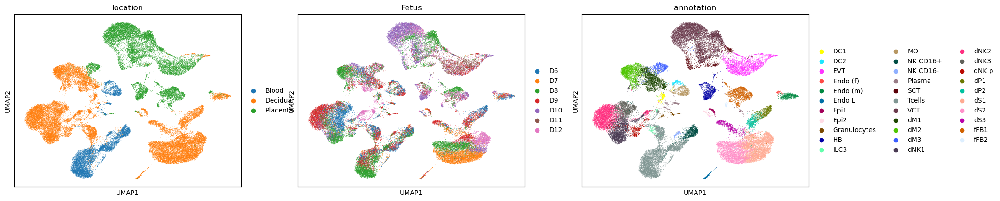

In [38]:
sc.pl.umap(adata_hvg, color=["location", "Fetus", "annotation"])

In [39]:
#re-run nearest neighbour graph based on  Meg's rule of thumb but a smaller pca
sc.pp.neighbors(adata_hvg, n_neighbors=254, n_pcs=25)
sc.tl.umap(adata_hvg)

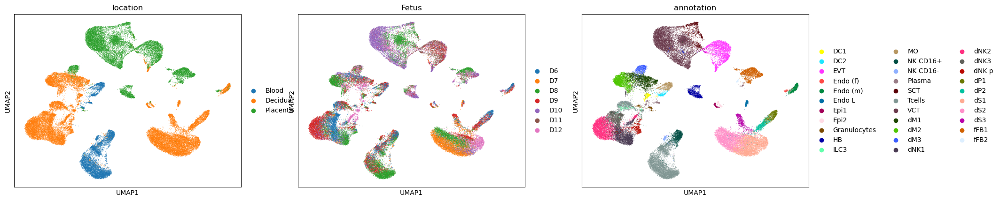

In [40]:
#plot
sc.pl.umap(adata_hvg, color=["location", "Fetus", "annotation"])


In [41]:
#re-run nearest neighbour graph and umap.. Terry suggested pcs 8 since from my pcs that is the place with th emuch difference
sc.pp.neighbors(adata_hvg, n_neighbors=254, n_pcs=8)
sc.tl.umap(adata_hvg)

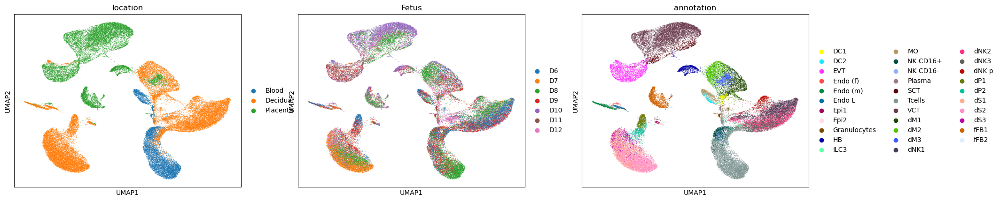

In [42]:
#plot
sc.pl.umap(adata_hvg, color=["location", "Fetus", "annotation"])

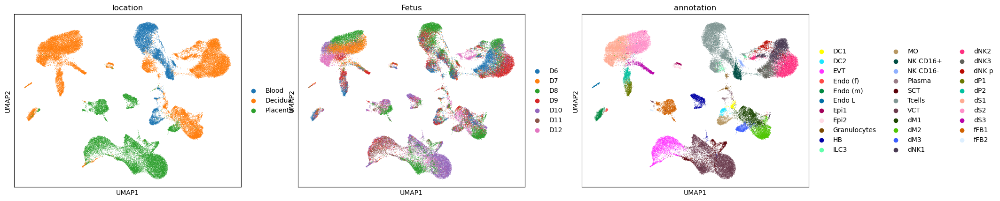

In [43]:
#THE UMAP I AM SELLTEING WITH
sc.pp.neighbors(adata_hvg, n_neighbors=254, n_pcs=30)
sc.tl.umap(adata_hvg)
#plot
sc.pl.umap(adata_hvg, color=["location", "Fetus", "annotation"])

### Leiden Clustering

In [44]:
#i kept changing teh resolution: 0.7 gave 23 clusters,
sc.tl.leiden(
    adata_hvg,
    resolution=0.7,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
)

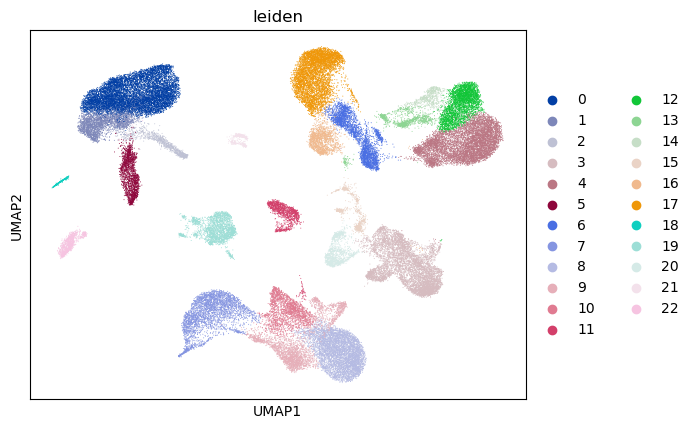

In [45]:
#plot 0.7 res map
sc.pl.umap(adata_hvg, color=["leiden"])

In [46]:
#i kept changing teh resolution: 0.7 gave 23 clusters, 0.5 gave 20 clusters
sc.tl.leiden(
    adata_hvg,
    resolution=0.5,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
)

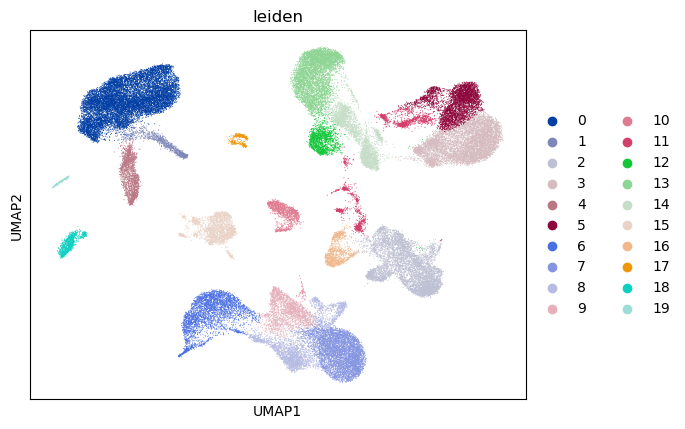

In [47]:
#plot 0.5 res map
sc.pl.umap(adata_hvg, color=["leiden"])

In [51]:
#i kept changing teh resolution: 0.7 gave 23 clusters, 0.5 gave 20 clusters, 0.2 gave 16 clusters
sc.tl.leiden(
    adata_hvg,
    resolution=0.2,
    random_state=0,
    flavor="igraph",
    n_iterations=2,
    directed=False,
)

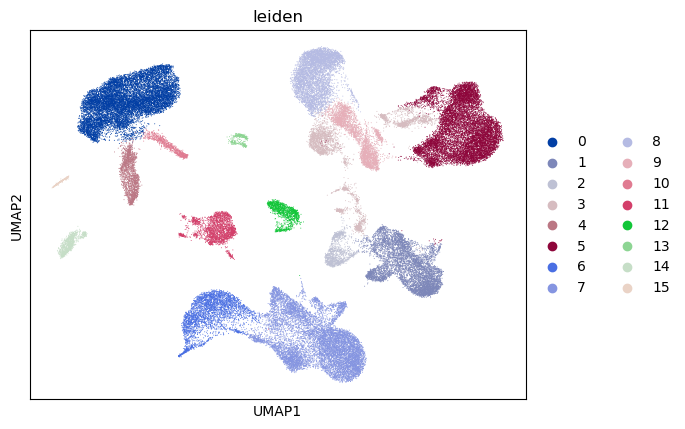

In [52]:
#plot map..I CHOOSE 0.2
sc.pl.umap(adata_hvg, color=["leiden"])

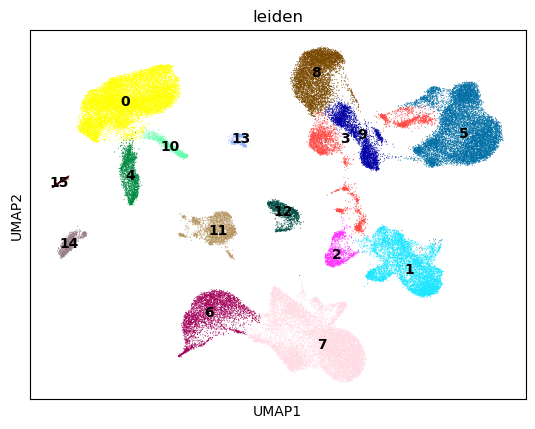

In [53]:
#plot map..I CHOOSE 0.2
sc.pl.umap(adata_hvg, color=["leiden"], legend_loc="on data", legend_fontsize=10, palette=sc.pl.palettes.default_102,)

In [ ]:
#to compare umap together
for res in [0.02, 0.5, 2.0]:
    sc.tl.leiden(adata_hvg, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph")
    
sc.pl.umap(
    adata_hvg,
    color=["leiden_res_0.02", "leiden_res_0.50", "leiden_res_2.00"],
    legend_loc="on data",
)

In [55]:
#check cluster sizes
adata_hvg.obs["leiden"].value_counts()

leiden
0     11916
5     11201
7     10578
1      6320
8      5590
6      3495
3      3444
9      3134
11     2316
4      1814
12     1249
2      1219
14      930
10      758
13      374
15      328
Name: count, dtype: int64

In [57]:
adata_hvg

AnnData object with n_obs × n_vars = 64666 × 4252
    obs: 'Fetus', 'location', 'final_cluster', 'annotation', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden'
    var: 'Accession', 'n_cells', 'mt', 'Mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'location_colors', 'log1p', 'hvg', 'pca', 'Fetus_colors', 'annotation_colors', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [58]:
adata

AnnData object with n_obs × n_vars = 64666 × 26212
    obs: 'Fetus', 'location', 'final_cluster', 'annotation', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb'
    var: 'Accession', 'n_cells', 'mt', 'Mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'dispersions', 'dispersions_norm'
    uns: 'location_colors', 'log1p', 'hvg'
    layers: 'counts'

In [59]:
#store my chosen final clusters in the main object under the name leiden
#this is so everything downstream (markers, dotplots, annotation, saving, sharing) uses the same label consistently.
adata.obs["leiden"] = adata_hvg.obs["leiden"]

In [60]:
#to see if leiden is not in main data
adata

AnnData object with n_obs × n_vars = 64666 × 26212
    obs: 'Fetus', 'location', 'final_cluster', 'annotation', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden'
    var: 'Accession', 'n_cells', 'mt', 'Mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'dispersions', 'dispersions_norm'
    uns: 'location_colors', 'log1p', 'hvg'
    layers: 'counts'

### Finding Cell marker genes

In [61]:
#checkin gif my raw data is still there
adata.raw is not None

True

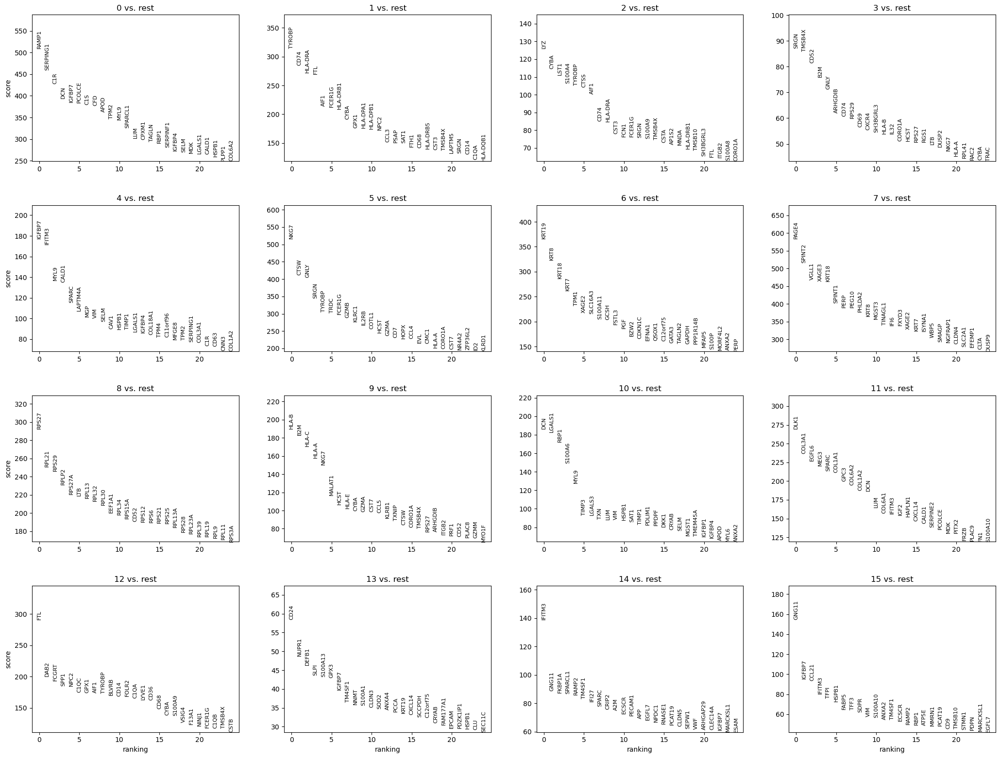

In [62]:
# Calculate the DEG on full object in each Leiden cluster using t-test
sc.tl.rank_genes_groups(adata, "leiden", method="t-test", use_raw=True)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False) 


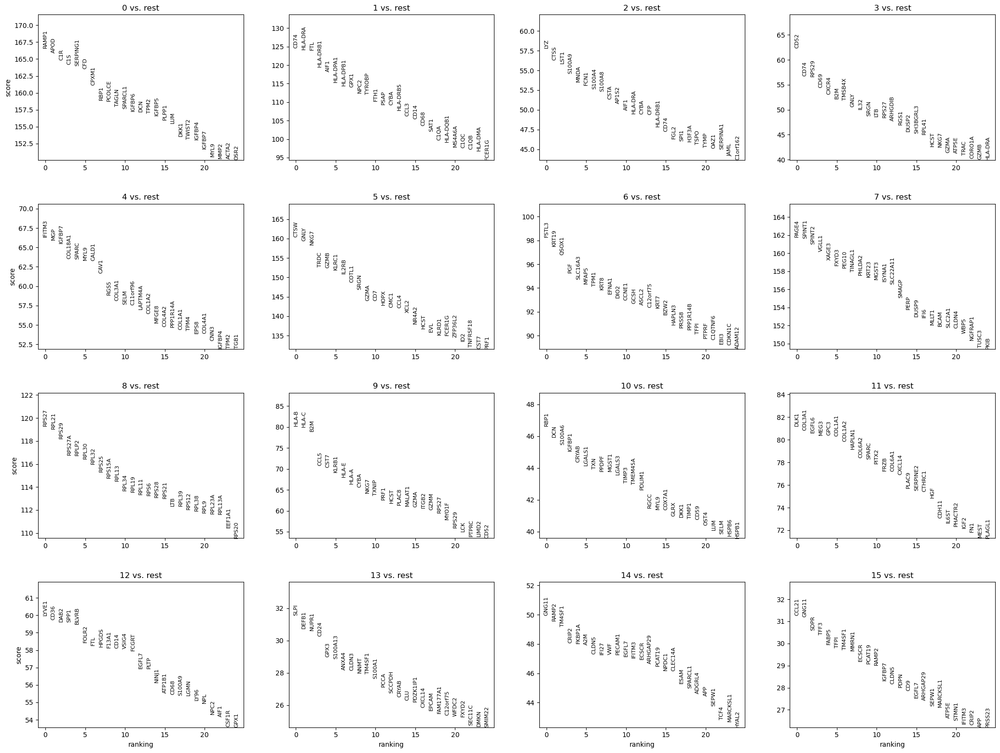

In [63]:
# Calculate the DEG on full object in each Leiden cluster using wilcoxon
sc.tl.rank_genes_groups(adata, "leiden", method="wilcoxon", use_raw=True)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)


In [64]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,RAMP1,CD74,LYZ,CD52,IFITM3,CTSW,FSTL3,PAGE4,RPS27,HLA-B,RBP1,DLK1,LYVE1,SLPI,GNG11,CCL21
1,APOD,HLA-DRA,CTSS,CD74,MGP,GNLY,KRT19,SPINT1,RPL21,HLA-C,DCN,COL3A1,CD36,DEFB1,RAMP2,GNG11
2,C1R,FTL,LST1,RPS29,IGFBP7,NKG7,QSOX1,SPINT2,RPS29,B2M,S100A6,EGFL6,DAB2,NUPR1,TM4SF1,SDPR
3,C1S,HLA-DRB1,S100A9,CD69,COL18A1,TRDC,PGF,VGLL1,RPS27A,CCL5,IGFBP1,MEG3,SPP1,CD24,CRIP2,TFF3
4,SERPING1,AIF1,MNDA,CXCR4,SPARC,GZMB,SLC16A3,XAGE3,RPLP2,CST7,CRYAB,GPC3,BLVRB,GPX3,FKBP1A,FABP5
5,CFD,HLA-DPA1,FCN1,B2M,MYL9,KLRC1,MFAP5,FXYD3,RPL30,KLRB1,LGALS1,COL1A1,FOLR2,S100A13,A2M,TFPI
6,CPXM1,HLA-DPB1,S100A4,TMSB4X,CALD1,IL2RB,TPM1,PEG10,RPL32,HLA-E,TXN,COL1A2,FTL,ANXA4,CLDN5,TM4SF1
7,RBP1,GPX1,S100A8,GNLY,CAV1,COTL1,KRT8,TINAGL1,RPS25,HLA-A,PPDPF,HAPLN1,HPGDS,CLDN3,IFI27,MMRN1
8,PCOLCE,NPC2,CSTA,IL32,RGS5,SRGN,EFNA1,PHLDA2,RPS15A,CYBA,MGST1,COL6A2,F13A1,NNMT,VWF,ECSCR
9,TAGLN,TYROBP,AP1S2,SRGN,COL3A1,GZMA,DIO2,KRT23,RPL13,NKG7,LGALS3,SPARC,CD14,TM4SF1,PECAM1,PCAT19


In [65]:
#save as csv
df = pd.DataFrame(adata.uns["rank_genes_groups"]["names"])
df.index.name = "rank"
df.to_csv("VentoTormo_full_cluster_genes.csv", index=False)

/home/jemima/miniconda3/envs/scanpy_env/lib/python3.11/site-packages/scanpy/tools/_utils.py:40: UserWarning: You’re trying to run this on 26212 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


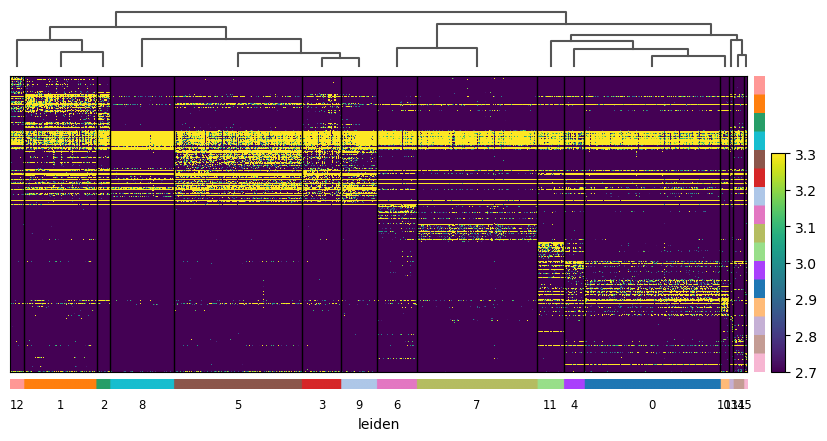

In [66]:
#Plot top 20 differentially expressed genes in a heatmap
sc.pl.rank_genes_groups_heatmap(adata, n_genes=20, swap_axes=True, show_gene_labels=False, vmin=3, vmax=3)

In [78]:
adata.write("ventotormo_preprocessed_umap_noannotation.h5ad")


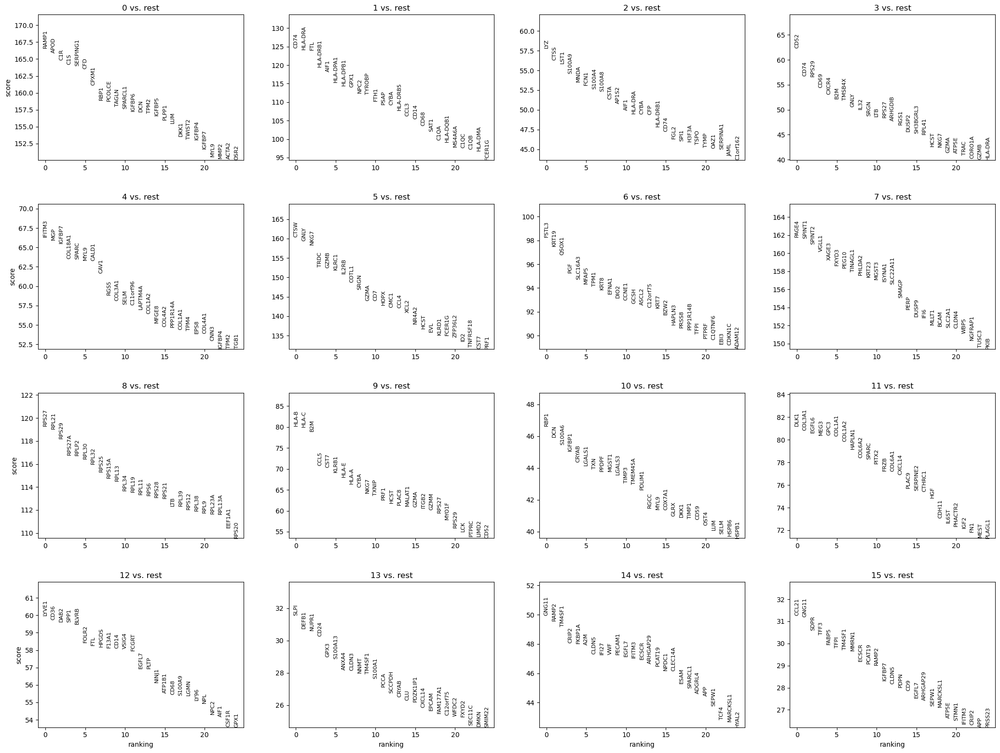

In [73]:
# Calculate the DEG on HVG in each Leiden cluster using wilcoxon
sc.tl.rank_genes_groups(adata_hvg, "leiden", method="wilcoxon", use_raw=True)
sc.pl.rank_genes_groups(adata_hvg, n_genes=25, sharey=False)


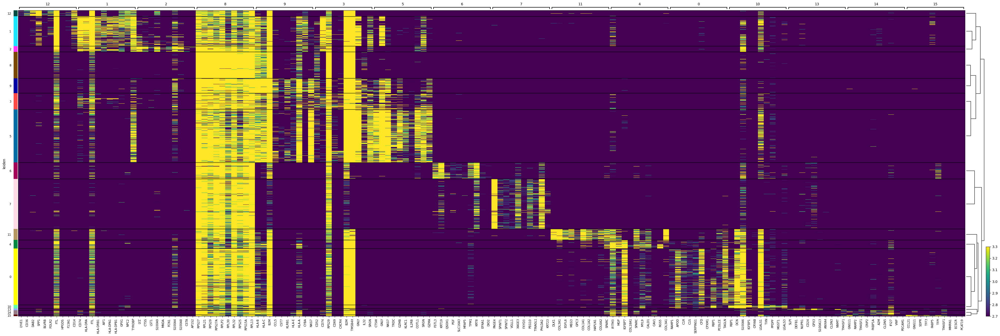

In [83]:
#sc.tl.dendrogram(adata_hvg, groupby="leiden")
sc.pl.rank_genes_groups_heatmap(adata_hvg, swap_axes=False, show_gene_labels=True, vmin=3, vmax=3, figsize=(50, 16))  #changing swap_axes to True will change the oreintation of teh graph

In [77]:
"dendrogram_leiden" in adata_hvg.uns


True

In [ ]:
#save HVG ranking as csv
df = pd.DataFrame(adata.uns["rank_genes_groups"]["names"])
df.index.name = "rank"
df.to_csv("HVG_VentoTormo_cluster_genes.csv", index=False)

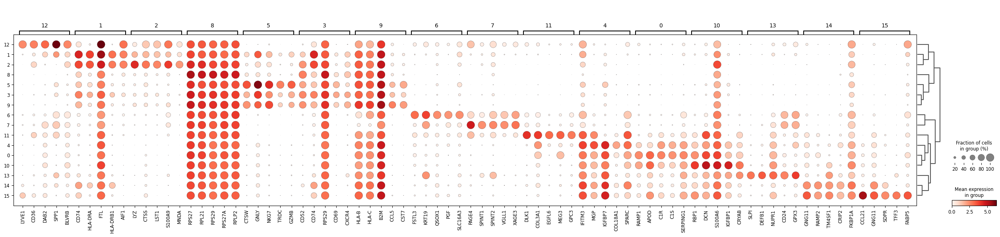

In [88]:
#use dotplot to check markers across clusters
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, groupby="leiden", use_raw=True)


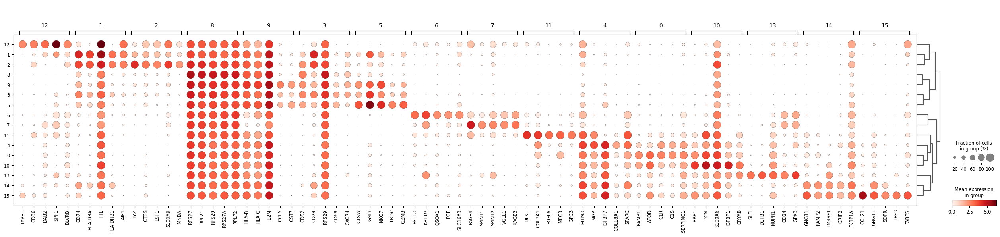

In [89]:
#use dotplot to check markers across clusters
sc.pl.rank_genes_groups_dotplot(adata_hvg, n_genes=5, groupby="leiden", use_raw=True)


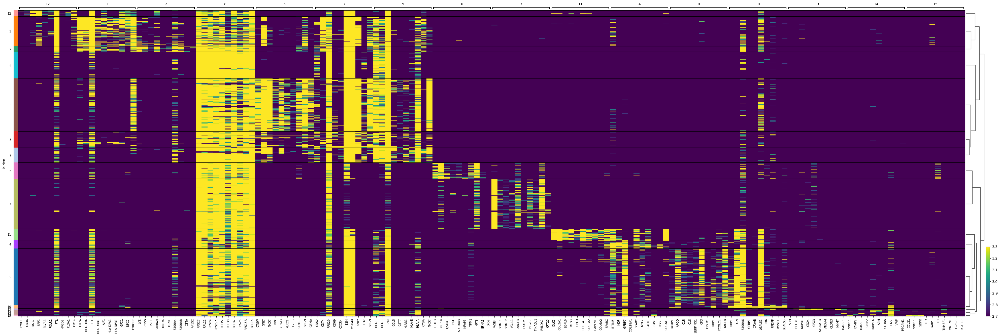

In [72]:
sc.pl.rank_genes_groups_heatmap(adata, swap_axes=False, show_gene_labels=True, vmin=3, vmax=3, figsize=(50, 16))  #changing swap_axes to True will change the oreintation of teh graph

### Checking output of what I've done previously 
I did the preprocessing before but I lost my Jupyter note so I had to the whole analysis again comparing that my outputs are the same including files......12/02/2026

In [2]:
#Load packages
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [79]:
#load h5ad data file of the current preprocessing i did, 
adata = sc.read_h5ad("ventotormo_preprocessed_umap_noannotation.h5ad")

In [80]:
adata

AnnData object with n_obs × n_vars = 64666 × 26212
    obs: 'Fetus', 'location', 'final_cluster', 'annotation', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden'
    var: 'Accession', 'n_cells', 'mt', 'Mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_leiden', 'hvg', 'leiden_colors', 'location_colors', 'log1p', 'pca', 'rank_genes_groups'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [81]:
adata_hvg

AnnData object with n_obs × n_vars = 64666 × 4252
    obs: 'Fetus', 'location', 'final_cluster', 'annotation', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden'
    var: 'Accession', 'n_cells', 'mt', 'Mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'location_colors', 'log1p', 'hvg', 'pca', 'Fetus_colors', 'annotation_colors', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'rank_genes_groups', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [84]:
#comparing the output to the old preprocessing i did which i lost the jupter note
#load h5ad data file, 
adata = sc.read_h5ad("Ventotormo_preprocessed_clustered_noannotation.h5ad")

In [85]:
adata

AnnData object with n_obs × n_vars = 64666 × 26212
    obs: 'Fetus', 'location', 'final_cluster', 'annotation', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden'
    var: 'Accession', 'n_cells', 'mt', 'Mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_leiden', 'hvg', 'leiden_colors', 'location_colors', 'log1p', 'pca', 'rank_genes_groups'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [86]:
adata_hvg

AnnData object with n_obs × n_vars = 64666 × 4252
    obs: 'Fetus', 'location', 'final_cluster', 'annotation', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden'
    var: 'Accession', 'n_cells', 'mt', 'Mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'location_colors', 'log1p', 'hvg', 'pca', 'Fetus_colors', 'annotation_colors', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'rank_genes_groups', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [90]:
adata.var

,Accession,n_cells,mt,Mt,ribo,hb,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm
Gene,,,,,,,,,,,,,,
TNMD,ENSG00000000005,164,False,False,False,False,164,0.006256,99.746656,405,False,0.002534,1.512004,2.933809
DPM1,ENSG00000000419,28157,False,False,False,False,28157,0.907607,56.503538,58753,False,0.391439,0.667898,-0.894674
SCYL3,ENSG00000000457,4757,False,False,False,False,4757,0.081286,92.651466,5262,False,0.048180,0.827680,-0.147556
C1orf112,ENSG00000000460,2922,False,False,False,False,2922,0.052260,95.486143,3383,False,0.023953,0.742644,-0.754405
FGR,ENSG00000000938,11605,False,False,False,False,11605,0.345166,82.072790,22344,True,0.255417,1.349905,7.303114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AP001059.6,ENSG00000278158,118,False,False,False,False,118,0.001869,99.817716,121,False,0.001847,1.200894,1.435634
AP001059.5,ENSG00000232010,22,False,False,False,False,22,0.000355,99.966015,23,False,0.000195,0.795396,-0.431995
LINC00165,ENSG00000261706,7,False,False,False,False,7,0.000108,99.989187,7,False,0.000037,0.457862,-1.066299


In [91]:
adata.obs

,Fetus,location,final_cluster,annotation,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_Mt,pct_counts_Mt,total_counts_ribo,pct_counts_ribo,total_counts_hb,pct_counts_hb,leiden
FCA7167222_TCTGGAACAGAGTGTG,D7,Decidua,0,dS1,5593,5593,44701,0,0.0,0,0.0,16498,36.907452,1,0.002237,0
FCA7167226_GGAACTTGTCTAAACC,D7,Decidua,0,dS1,2761,2761,11041,0,0.0,0,0.0,3302,29.906711,0,0.000000,0
FCA7196225_ACTATCTCATTCACTT,D9,Decidua,0,dS1,2347,2347,10079,0,0.0,0,0.0,2316,22.978470,0,0.000000,0
FCA7474063_AAAGCAAGTCAAACTC,D10,Decidua,0,dS1,3722,3722,19106,0,0.0,0,0.0,6123,32.047524,0,0.000000,0
FCA7196219_CTCGAAAGTTAAGTAG,D8,Decidua,0,dS1,2248,2248,9195,0,0.0,0,0.0,3382,36.780859,0,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FCA7196219_GAGTCCGTCACGCGGT,D8,Decidua,50,Epi2,1593,1593,2903,0,0.0,0,0.0,365,12.573200,0,0.000000,13
FCA7511882_AACCGCGCATTACCTT,D12,Decidua,50,Epi2,1217,1217,3484,0,0.0,0,0.0,268,7.692308,0,0.000000,13
FCA7167226_CTACCCATCCCACTTG,D7,Decidua,50,Epi2,991,991,3402,0,0.0,0,0.0,870,25.573192,0,0.000000,13
FCA7167224_AGCCTAACACCATCCT,D6,Decidua,50,Epi2,3712,3712,19175,0,0.0,0,0.0,6592,34.378096,0,0.000000,13


### Annotating clusters
The cellxgene gene expression tool (https://cellxgene.cziscience.com/gene-expression) can also be quite useful to see which cell types a gene has been expressed in across many existing datasets.

In [1]:
#Load packages
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
#comparing the output to the old preprocessing i did which i lost the jupter note
#load h5ad data file, 
adata = sc.read_h5ad("ventotormo_preprocessed_umap_noannotation.h5ad")

In [4]:
#see the top 20 DEG gene names in the Table
pd.DataFrame(adata.uns["rank_genes_groups"]["names"]).head(20)
#when i previously plotted the adata_hvg top 20 before restarting my kernel..cluster 8 genes changed..I can see this from teh HVG_VentoTormo csv

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,RAMP1,CD74,LYZ,CD52,IFITM3,CTSW,FSTL3,PAGE4,RPS27,HLA-B,RBP1,DLK1,LYVE1,SLPI,GNG11,CCL21
1,APOD,HLA-DRA,CTSS,CD74,MGP,GNLY,KRT19,SPINT1,RPL21,HLA-C,DCN,COL3A1,CD36,DEFB1,RAMP2,GNG11
2,C1R,FTL,LST1,RPS29,IGFBP7,NKG7,QSOX1,SPINT2,RPS29,B2M,S100A6,EGFL6,DAB2,NUPR1,TM4SF1,SDPR
3,C1S,HLA-DRB1,S100A9,CD69,COL18A1,TRDC,PGF,VGLL1,RPS27A,CCL5,IGFBP1,MEG3,SPP1,CD24,CRIP2,TFF3
4,SERPING1,AIF1,MNDA,CXCR4,SPARC,GZMB,SLC16A3,XAGE3,RPLP2,CST7,CRYAB,GPC3,BLVRB,GPX3,FKBP1A,FABP5
5,CFD,HLA-DPA1,FCN1,B2M,MYL9,KLRC1,MFAP5,FXYD3,RPL30,KLRB1,LGALS1,COL1A1,FOLR2,S100A13,A2M,TFPI
6,CPXM1,HLA-DPB1,S100A4,TMSB4X,CALD1,IL2RB,TPM1,PEG10,RPL32,HLA-E,TXN,COL1A2,FTL,ANXA4,CLDN5,TM4SF1
7,RBP1,GPX1,S100A8,GNLY,CAV1,COTL1,KRT8,TINAGL1,RPS25,HLA-A,PPDPF,HAPLN1,HPGDS,CLDN3,IFI27,MMRN1
8,PCOLCE,NPC2,CSTA,IL32,RGS5,SRGN,EFNA1,PHLDA2,RPS15A,CYBA,MGST1,COL6A2,F13A1,NNMT,VWF,ECSCR
9,TAGLN,TYROBP,AP1S2,SRGN,COL3A1,GZMA,DIO2,KRT23,RPL13,NKG7,LGALS3,SPARC,CD14,TM4SF1,PECAM1,PCAT19


In [6]:
#see the top 20 HVG DEG gene names in the Table
pd.DataFrame(adata_hvg.uns["rank_genes_groups"]["names"]).head(20)

NameError: name 'adata_hvg' is not defined

In [10]:
adata_hvg
#I could not find adata_hvg 
#when i previously plotted adata_hvg top 20 DEG before restarting my kernel..cluster 8 genes changed..I can see this from teh HVG_VentoTormo csv

NameError: name 'adata_hvg' is not defined

In [9]:
#sanity check 
print("obs:", adata.n_obs, "vars:", adata.n_vars)
print("has leiden?", "leiden" in adata.obs.columns)
print("has rank_genes_groups?", "rank_genes_groups" in adata.uns)
print("has highly_variable?", "highly_variable" in adata.var.columns)
print("raw present?", adata.raw is not None)
if adata.raw is not None:
    print("raw vars:", adata.raw.n_vars)


obs: 64666 vars: 26212
has leiden? True
has rank_genes_groups? True
has highly_variable? True
raw present? True
raw vars: 26212


In [11]:
#has highly_variable? TRUE. so i want to see it
adata.var["highly_variable"].value_counts()


highly_variable
False    21960
True      4252
Name: count, dtype: int64

In [13]:
#Look at the HVG rows in .var (their stats)
adata.var.loc[adata.var["highly_variable"], :].head(10)

,Accession,n_cells,mt,Mt,ribo,hb,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,highly_variable_rank,means,variances,variances_norm,dispersions,dispersions_norm
Gene,,,,,,,,,,,,,,,,,
FGR,ENSG00000000938,11605,False,False,False,False,11605,0.345166,82.072790,22344,True,877.0,0.255417,0.344789,1.615377,1.349905,7.303114
CFH,ENSG00000000971,2227,False,False,False,False,2227,0.056585,96.559768,3663,True,NaN,0.028881,0.029717,1.163627,1.028954,1.323896
NIPAL3,ENSG00000001461,3525,False,False,False,False,3525,0.058346,94.554639,3777,True,NaN,0.046545,0.049415,1.216332,1.061649,1.858636
ENPP4,ENSG00000001561,923,False,False,False,False,923,0.014923,98.574165,966,True,NaN,0.013002,0.015128,1.313103,1.163498,1.655263
LAP3,ENSG00000002549,22492,False,False,False,False,22492,0.622532,65.254735,40299,True,NaN,0.313013,0.262076,1.009718,0.837269,1.141182
HS3ST1,ENSG00000002587,2822,False,False,False,False,2822,0.091930,95.640622,5951,True,NaN,0.033099,0.032829,1.126599,0.991829,1.046796
AOC1,ENSG00000002726,899,False,False,False,False,899,0.144545,98.611240,9357,True,132.0,0.015282,0.033578,2.480045,2.197191,7.522990
MAD1L1,ENSG00000002822,9900,False,False,False,False,9900,0.179875,84.706646,11644,True,NaN,0.118681,0.109725,1.076871,0.924541,1.156343
LASP1,ENSG00000002834,21671,False,False,False,False,21671,0.565993,66.523002,36639,True,NaN,0.350241,0.340946,1.182150,0.973463,2.778239


In [15]:
#has highly_variable? TRUE..so that means it calculated it but doesnt have it in this h5ad file becaus etwo AnnData object cannot be inside one .h5ad 
#TO RECREATE adata_hvg without overwriting adata run the code below
adata_hvg = adata[:, adata.var["highly_variable"]].copy()

adata_hvg

AnnData object with n_obs × n_vars = 64666 × 4252
    obs: 'Fetus', 'location', 'final_cluster', 'annotation', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden'
    var: 'Accession', 'n_cells', 'mt', 'Mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_leiden', 'hvg', 'leiden_colors', 'location_colors', 'log1p', 'pca', 'rank_genes_groups'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [ ]:
#to save the adata_hvg as a new file
#adata_hvg.write_h5ad("ventotormo_hvg.h5ad", compression="gzip")


In [18]:
#if i want my marker gene as a list for coding
top_n = 15
names_df = pd.DataFrame(adata.uns["rank_genes_groups"]["names"])

# all clusters (whatever columns exist)
marker_genes_all = {c: names_df[c].head(top_n).tolist() for c in names_df.columns}

marker_genes_all

for cl, genes in marker_genes_all.items():
    print(f"Cluster {cl}:")
    print(", ".join(genes))
    print()


Cluster 0:
RAMP1, APOD, C1R, C1S, SERPING1, CFD, CPXM1, RBP1, PCOLCE, TAGLN, SPARCL1, IGFBP6, DCN, TPM2, IGFBP5

Cluster 1:
CD74, HLA-DRA, FTL, HLA-DRB1, AIF1, HLA-DPA1, HLA-DPB1, GPX1, NPC2, TYROBP, FTH1, PSAP, CYBA, HLA-DRB5, CCL3

Cluster 2:
LYZ, CTSS, LST1, S100A9, MNDA, FCN1, S100A4, S100A8, CSTA, AP1S2, AIF1, HLA-DRA, CYBA, CFP, HLA-DRB1

Cluster 3:
CD52, CD74, RPS29, CD69, CXCR4, B2M, TMSB4X, GNLY, IL32, SRGN, LTB, RPS27, ARHGDIB, RGS1, DUSP2

Cluster 4:
IFITM3, MGP, IGFBP7, COL18A1, SPARC, MYL9, CALD1, CAV1, RGS5, COL3A1, SELM, C11orf96, LAPTM4A, COL1A2, MFGE8

Cluster 5:
CTSW, GNLY, NKG7, TRDC, GZMB, KLRC1, IL2RB, COTL1, SRGN, GZMA, CD7, HOPX, CMC1, CCL4, XCL2

Cluster 6:
FSTL3, KRT19, QSOX1, PGF, SLC16A3, MFAP5, TPM1, KRT8, EFNA1, DIO2, CCNE1, GCSH, ASCL2, C12orf75, KRT7

Cluster 7:
PAGE4, SPINT1, SPINT2, VGLL1, XAGE3, FXYD3, PEG10, TINAGL1, PHLDA2, KRT23, MGST3, ISYNA1, SLC22A11, SMAGP, PERP

Cluster 8:
RPS27, RPL21, RPS29, RPS27A, RPLP2, RPL30, RPL32, RPS25, RPS15A, RPL13, 

In [ ]:
#If you only want to check one cluster (for example 0)
marker_genes_all["0"]

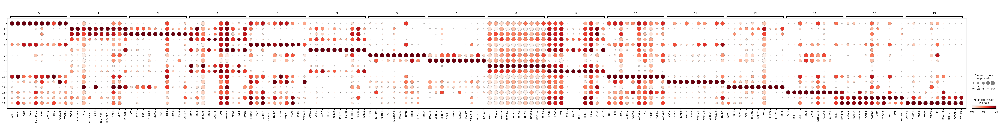

In [45]:
#my top 20 in list
fulltopranked_genes = {
  '0':  ['RAMP1', 'APOD', 'C1R', 'C1S', 'SERPING1', 'CFD', 'CPXM1', 'RBP1', 'PCOLCE', 'TAGLN'],
  '1':  ['CD74', 'HLA-DRA', 'FTL', 'HLA-DRB1', 'AIF1', 'HLA-DPA1', 'HLA-DPB1', 'GPX1', 'NPC2', 'TYROBP'],
  '2':  ['LYZ', 'CTSS', 'LST1', 'S100A9', 'MNDA', 'FCN1', 'S100A4', 'S100A8', 'CSTA', 'AP1S2'],
  '3':  ['CD52', 'CD74', 'RPS29', 'CD69', 'CXCR4', 'B2M', 'TMSB4X', 'GNLY', 'IL32', 'SRGN'],
  '4':  ['IFITM3', 'MGP', 'IGFBP7', 'COL18A1', 'SPARC', 'MYL9', 'CALD1', 'CAV1', 'RGS5', 'COL3A1'],
  '5':  ['CTSW', 'GNLY', 'NKG7', 'TRDC', 'GZMB', 'KLRC1', 'IL2RB', 'COTL1', 'SRGN', 'GZMA'],
  '6':  ['FSTL3', 'KRT19', 'QSOX1', 'PGF', 'SLC16A3', 'MFAP5', 'TPM1', 'KRT8', 'EFNA1', 'DIO2'],
  '7':  ['PAGE4', 'SPINT1', 'SPINT2', 'VGLL1', 'XAGE3', 'FXYD3', 'PEG10', 'TINAGL1', 'PHLDA2', 'KRT23'],
  '8':  ['RPS27', 'RPL21', 'RPS29', 'RPS27A', 'RPLP2', 'RPL30', 'RPL32', 'RPS25', 'RPS15A', 'RPL13'],
  '9':  ['HLA-B', 'HLA-C', 'B2M', 'CCL5', 'CST7', 'KLRB1', 'HLA-E', 'HLA-A', 'CYBA', 'NKG7'],
  '10': ['RBP1', 'DCN', 'S100A6', 'IGFBP1', 'CRYAB', 'LGALS1', 'TXN', 'PPDPF', 'MGST1', 'LGALS3'],
  '11': ['DLK1', 'COL3A1', 'EGFL6', 'MEG3', 'GPC3', 'COL1A1', 'COL1A2', 'HAPLN1', 'COL6A2', 'SPARC'],
  '12': ['LYVE1', 'CD36', 'DAB2', 'SPP1', 'BLVRB', 'FOLR2', 'FTL', 'HPGDS', 'F13A1', 'CD14'],
  '13': ['SLPI', 'DEFB1', 'NUPR1', 'CD24', 'GPX3', 'S100A13', 'ANXA4', 'CLDN3', 'NNMT', 'TM4SF1'],
  '14': ['GNG11', 'RAMP2', 'TM4SF1', 'CRIP2', 'FKBP1A', 'A2M', 'CLDN5', 'IFI27', 'VWF', 'PECAM1'],
  '15': ['CCL21', 'GNG11', 'SDPR', 'TFF3', 'FABP5', 'TFPI', 'TM4SF1', 'MMRN1', 'ECSCR', 'PCAT19']
}

#visualise 
sc.pl.dotplot(
    adata,
    var_names=fulltopranked_genes,
    groupby='leiden',
    use_raw=True,
    standard_scale="var",
)

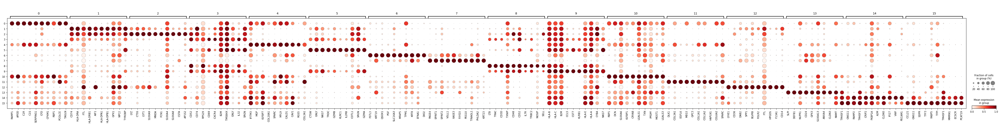

In [44]:
#my top 20 in list
HVGtopranked_genes = {
  '0':  ['RAMP1', 'APOD', 'C1R', 'C1S', 'SERPING1', 'CFD', 'CPXM1', 'RBP1', 'PCOLCE', 'TAGLN'],
  '1':  ['CD74', 'HLA-DRA', 'FTL', 'HLA-DRB1', 'AIF1', 'HLA-DPA1', 'HLA-DPB1', 'GPX1', 'NPC2', 'TYROBP'],
  '2':  ['LYZ', 'CTSS', 'LST1', 'S100A9', 'MNDA', 'FCN1', 'S100A4', 'S100A8', 'CSTA', 'AP1S2'],
  '3':  ['CD52', 'CD74', 'RPS29', 'CD69', 'CXCR4', 'B2M', 'TMSB4X', 'GNLY', 'IL32', 'SRGN'],
  '4':  ['IFITM3', 'MGP', 'IGFBP7', 'COL18A1', 'SPARC', 'MYL9', 'CALD1', 'CAV1', 'RGS5', 'COL3A1'],
  '5':  ['CTSW', 'GNLY', 'NKG7', 'TRDC', 'GZMB', 'KLRC1', 'IL2RB', 'COTL1', 'SRGN', 'GZMA'],
  '6':  ['FSTL3', 'KRT19', 'QSOX1', 'PGF', 'SLC16A3', 'MFAP5', 'TPM1', 'KRT8', 'EFNA1', 'DIO2'],
  '7':  ['PAGE4', 'SPINT1', 'SPINT2', 'VGLL1', 'XAGE3', 'FXYD3', 'PEG10', 'TINAGL1', 'PHLDA2', 'KRT23'],
  '8':  ['LTB', 'TRAC', 'CD3D', 'TXNIP', 'CD48', 'CD52', 'IL7R', 'TRBC2', 'NOSIP', 'SELL'],
  '9':  ['HLA-B', 'HLA-C', 'B2M', 'CCL5', 'CST7', 'KLRB1', 'HLA-E', 'HLA-A', 'CYBA', 'NKG7'],
  '10': ['RBP1', 'DCN', 'S100A6', 'IGFBP1', 'CRYAB', 'LGALS1', 'TXN', 'PPDPF', 'MGST1', 'LGALS3'],
  '11': ['DLK1', 'COL3A1', 'EGFL6', 'MEG3', 'GPC3', 'COL1A1', 'COL1A2', 'HAPLN1', 'COL6A2', 'SPARC'],
  '12': ['LYVE1', 'CD36', 'DAB2', 'SPP1', 'BLVRB', 'FOLR2', 'FTL', 'HPGDS', 'F13A1', 'CD14'],
  '13': ['SLPI', 'DEFB1', 'NUPR1', 'CD24', 'GPX3', 'S100A13', 'ANXA4', 'CLDN3', 'NNMT', 'TM4SF1'],
  '14': ['GNG11', 'RAMP2', 'TM4SF1', 'CRIP2', 'FKBP1A', 'A2M', 'CLDN5', 'IFI27', 'VWF', 'PECAM1'],
  '15': ['CCL21', 'GNG11', 'SDPR', 'TFF3', 'FABP5', 'TFPI', 'TM4SF1', 'MMRN1', 'ECSCR', 'PCAT19']
}

#visualise 
sc.pl.dotplot(
    adata,
    var_names=HVGtopranked_genes,
    groupby='leiden',
    use_raw=True,
    standard_scale="var",
)

In [ ]:
cluster_map = {
    "0": "???",
    "1": "???",
    "2": "???",
    "3": "???",
    "4": "???",
    "5": "???",
    "6": "???",
    "7": "???",
    "8": "??",
    "9": "???",
    "10": "???",
    "11": "???",
    "12": "???",
    "13": "???",
    "14": "??",
    "15": "??",
}


In [ ]:
#write the labels into .obs
adata.obs["cell_type"] = adata.obs["leiden"].map(cluster_map).astype("category")

In [ ]:
#plot umap with label
#adata_hvg.obs["cell_type"] = adata.obs["cell_type"]
sc.pl.umap(adata, color=["leiden", "cell_type"], legend_loc="on data", size=150,
           frameon=False, legend_fontsize=10, legend_fontoutline=2)#, save='name_of_file.svg')

In [ ]:
#save annotated file
adata.write_h5ad("Ventotormo_preprocessed_annotated.h5ad", compression="gzip")

In [1]:
#Load packages
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
# Load the CSV files
hvg_df = pd.read_csv('HVG_VentoTormo_cluster_genes.csv')  
top_genes_df = pd.read_csv('VentoTormo_full_cluster_genes.csv') 

In [3]:
#comparing the output to the old preprocessing i did which i lost the jupter note
#load h5ad data file, 
adata = sc.read_h5ad("ventotormo_preprocessed_umap_noannotation.h5ad")

In [4]:
# Preview the data to understand the structure
print(hvg_df.head())

          0         1       2      3        4     5        6       7      8  \
0     RAMP1      CD74     LYZ   CD52   IFITM3  CTSW    FSTL3   PAGE4    LTB   
1      APOD   HLA-DRA    CTSS   CD74      MGP  GNLY    KRT19  SPINT1   TRAC   
2       C1R  HLA-DRB1    LST1   CD69   IGFBP7  NKG7    QSOX1  SPINT2   CD3D   
3       C1S      AIF1  S100A9  CXCR4  COL18A1  TRDC      PGF   VGLL1  TXNIP   
4  SERPING1  HLA-DPA1    MNDA   GNLY    SPARC  GZMB  SLC16A3   XAGE3   CD48   

       9      10      11     12     13      14     15  
0  HLA-B    RBP1    DLK1  LYVE1   SLPI   GNG11  CCL21  
1   CCL5     DCN  COL3A1   CD36  DEFB1   RAMP2  GNG11  
2   CST7  IGFBP1   EGFL6   DAB2  NUPR1  TM4SF1   SDPR  
3  KLRB1   CRYAB    MEG3   SPP1   CD24   CRIP2   TFF3  
4  HLA-A  LGALS1    GPC3  BLVRB   GPX3     A2M  FABP5  


In [5]:
print(top_genes_df.head())

          0         1       2      3        4     5        6       7       8  \
0     RAMP1      CD74     LYZ   CD52   IFITM3  CTSW    FSTL3   PAGE4   RPS27   
1      APOD   HLA-DRA    CTSS   CD74      MGP  GNLY    KRT19  SPINT1   RPL21   
2       C1R       FTL    LST1  RPS29   IGFBP7  NKG7    QSOX1  SPINT2   RPS29   
3       C1S  HLA-DRB1  S100A9   CD69  COL18A1  TRDC      PGF   VGLL1  RPS27A   
4  SERPING1      AIF1    MNDA  CXCR4    SPARC  GZMB  SLC16A3   XAGE3   RPLP2   

       9      10      11     12     13      14     15  
0  HLA-B    RBP1    DLK1  LYVE1   SLPI   GNG11  CCL21  
1  HLA-C     DCN  COL3A1   CD36  DEFB1   RAMP2  GNG11  
2    B2M  S100A6   EGFL6   DAB2  NUPR1  TM4SF1   SDPR  
3   CCL5  IGFBP1    MEG3   SPP1   CD24   CRIP2   TFF3  
4   CST7   CRYAB    GPC3  BLVRB   GPX3  FKBP1A  FABP5  


In [5]:
# Reshape the 'top_genes_df' into long format where each row is (cluster, gene)
top_genes_long = top_genes_df.melt(var_name="Cluster", value_name="Gene")

In [6]:
# Check the first few rows of the reshaped data
print(top_genes_long.head())

  Cluster      Gene
0       0     RAMP1
1       0      APOD
2       0       C1R
3       0       C1S
4       0  SERPING1


In [8]:
adata

AnnData object with n_obs × n_vars = 64666 × 26212
    obs: 'Fetus', 'location', 'final_cluster', 'annotation', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'leiden'
    var: 'Accession', 'n_cells', 'mt', 'Mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'dispersions', 'dispersions_norm'
    uns: 'dendrogram_leiden', 'hvg', 'leiden_colors', 'location_colors', 'log1p', 'pca', 'rank_genes_groups'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [27]:
# Define the marker genes panel (make sure to include the appropriate genes)
marker_panel = [
    "CD14", "CD163", "CD68", "LYVE1", "FCGR1A", "FOLR2", "CSF1R", "FR-Beta", 
    "IL10", "CD11b", "MERTK", "CD209", "CD53",  # Hofbauer Cells (M2)
    "HAMP", "KLF2", "MS4A7", "PLTP", "SEPP1", "VSIG4", "C1QA", "CCL3", "EGR2", 
    "FCGR3A", "FOLR2",  # Decidual Macrophages (M1)
    "SDC1", "CYP19A1", "CGA", "CD63", "GH2", "MUC16", "S100P", "CSH1", "KISS1", 
    "PSG11", "ERVWE1", "GCM1", "LGALS13",  # Syncytiotrophoblasts (STB)
    "HLA-G", "MMP9", "MMP2", "CD9", "ITGA5", "ITGA1", "PAPPA2", "DIO2", "FSTL3", 
    "PRG2", "PAPPA2",  # EVTs
    "ACTA2", "Integrin a1b1", "COL1A1", "DCN", "FBLN2", "PDGFRA", "APOD", "VCAM",  # Fibroblasts
    "CEACAM1", "CDH5", "GNLY", "HLA-DQB1", "MAGEA8", "MYCT1", "KLRC1", "HLA-DRA", 
    "PAGE4", "PECAM1", "TRDC", "CD74", "PEG10", "VWF", "NKG7", "CDVL", "PARP1", "FCGR2B", 
    "TNFRSF18", "PPT1", "LGALS2", "EGFR", "HLA-DPB1", "ITGA6", "HLA-DQA1", "TP63", 
    "TEAD4", "TIMP1", "BCAM", "EREG", "ILIB", "CXCL3", "CCL20", "FBP1", "OLR1", "CXCL2", 
    "MARCO", "S100A8",  # Dendritic and Myeloid Immune Cells
    "XBP1", "PRDM1", "CD138", "MZB1", "SSR4",  # Plasma Cells
    "FGF10", "Cytokeratin-17", "CEACAM1", "MAGEA8", "PAGE4", "PEG10", "PARP1", "EGFR", 
    "ITGA6", "TP63", "TEAD4", "BCAM",  # Cytotrophoblasts (CTB)
    "PLVAP", "CD31", "CDH5", "PECAM1", "VWF", "FCGR2B",  # Endothelial Cells
    "GNLY", "KLRC1", "TRDC",  # Decidual NK (dNK) Cells
    "CD56", "CD161", "CD57",  # CD16+ NK Cells
    "CD56", "CD7", "GNLY", "CD9", "CD49a", "CD103", "Cd160-", "KIR2DL3", "XCL1", "XCL2", 
    "CHST12", "IL2RB", "GZMB", "CTSW",  # Decidua Stromal (dS2/dS3)
    "ACTA2", "TAGLN", "MYL9", "COL1A2",  # Non-Decidualized Stroma (dS1)
    "CLEC4M", "VWF", "CLDN5", "MYH11", "ACTA2", "MCAM", "RGS5",  # Perivascular Cells
    "EPCAM", "CDH1", "KRT8", "KRT18",  # Epithelial Cells
    "CD4", "CD8+", "CD69+", "TRAC", "TRBC1", "LCK", "CCL5", "CD8A", "QZMK", "IFNG", 
    "ICOS", "CD3D",  # T Cells
    "CD127", "GATA3", "CRTH2", "CD90", "CD45", "ILC1", "GATA3", "KLRG1", "CD278", 
    "LYVE1"  # Innate Lymphoid Cells
]

# Define the cluster key, usually it's 'leiden' for Leiden clustering
cluster_key = 'leiden'  # Change this if you are using a different clustering method/column


In [28]:
# Visualize the Dotplot for the top marker genes across clusters
sc.pl.dotplot(
    adata,
    var_names=marker_panel,
    groupby=cluster_key,  # Ensure this matches the column name for your clusters (e.g., 'leiden')
    use_raw=True,  
    standard_scale="var", # Standardize the expression by gene
    legend_loc=True
)

KeyError: "Could not find keys ['CD103', 'CD11b', 'CD127', 'CD138', 'CD161', 'CD278', 'CD31', 'CD45', 'CD49a', 'CD56', 'CD57', 'CD69+', 'CD8+', 'CD90', 'CDVL', 'CRTH2', 'Cd160-', 'Cytokeratin-17', 'ERVWE1', 'FR-Beta', 'ILC1', 'ILIB', 'Integrin a1b1', 'QZMK', 'VCAM'] in columns of `adata.obs` or in adata.raw.var_names."

In [29]:
# Check if all genes in marker_panel exist in adata.var_names
missing_genes = [gene for gene in marker_panel if gene not in adata.var_names]
print(f"Missing genes: {missing_genes}")


Missing genes: ['FR-Beta', 'CD11b', 'ERVWE1', 'Integrin a1b1', 'VCAM', 'CDVL', 'ILIB', 'CD138', 'Cytokeratin-17', 'CD31', 'CD56', 'CD161', 'CD57', 'CD56', 'CD49a', 'CD103', 'Cd160-', 'CD8+', 'CD69+', 'QZMK', 'CD127', 'CRTH2', 'CD90', 'CD45', 'ILC1', 'CD278']


In [30]:
# List of missing genes from the dataset
missing_genes = [
    'FR-Beta', 'CD11b', 'ERVWE1', 'Integrin a1b1', 'VCAM', 'CDVL', 'ILIB', 'CD138', 
    'Cytokeratin-17', 'CD31', 'CD56', 'CD161', 'CD57', 'CD56', 'CD56', 'CD49a', 'CD103', 
    'Cd160-', 'CD8+', 'CD69+', 'QZMK', 'CD127', 'CRTH2', 'CD90', 'CD45', 
    'ILC1', 'CD278'
]

# Define the marker genes panel (make sure to include the appropriate genes)
marker_panel = [
    "CD14", "CD163", "CD68", "LYVE1", "FCGR1A", "FOLR2", "CSF1R", "FR-Beta", 
    "IL10", "CD11b", "MERTK", "CD209", "CD53",  # Hofbauer Cells (M2)
    "HAMP", "KLF2", "MS4A7", "PLTP", "SEPP1", "VSIG4", "C1QA", "CCL3", "EGR2", 
    "FCGR3A", "FOLR2",  # Decidual Macrophages (M1)
    "SDC1", "CYP19A1", "CGA", "CD63", "GH2", "MUC16", "S100P", "CSH1", "KISS1", 
    "PSG11", "ERVWE1", "GCM1", "LGALS13",  # Syncytiotrophoblasts (STB)
    "HLA-G", "MMP9", "MMP2", "CD9", "ITGA5", "ITGA1", "PAPPA2", "DIO2", "FSTL3", 
    "PRG2", "PAPPA2",  # EVTs
    "ACTA2", "Integrin a1b1", "COL1A1", "DCN", "FBLN2", "PDGFRA", "APOD", "VCAM",  # Fibroblasts
    "CEACAM1", "CDH5", "GNLY", "HLA-DQB1", "MAGEA8", "MYCT1", "KLRC1", "HLA-DRA", 
    "PAGE4", "PECAM1", "TRDC", "CD74", "PEG10", "VWF", "NKG7", "CDVL", "PARP1", "FCGR2B", 
    "TNFRSF18", "PPT1", "LGALS2", "EGFR", "HLA-DPB1", "ITGA6", "HLA-DQA1", "TP63", 
    "TEAD4", "TIMP1", "BCAM", "EREG", "ILIB", "CXCL3", "CCL20", "FBP1", "OLR1", "CXCL2", 
    "MARCO", "S100A8",  # Dendritic and Myeloid Immune Cells
    "XBP1", "PRDM1", "CD138", "MZB1", "SSR4",  # Plasma Cells
    "FGF10", "Cytokeratin-17", "CEACAM1", "MAGEA8", "PAGE4", "PEG10", "PARP1", "EGFR", 
    "ITGA6", "TP63", "TEAD4", "BCAM",  # Cytotrophoblasts (CTB)
    "PLVAP", "CD31", "CDH5", "PECAM1", "VWF", "FCGR2B",  # Endothelial Cells
    "CD56", "GNLY", "KLRC1", "TRDC",  # Decidual NK (dNK) Cells
    "CD56", "CD161", "CD57",  # CD16+ NK Cells
    "CD56", "CD7", "GNLY", "CD9", "CD49a", "CD103", "Cd160-", "KIR2DL3", "XCL1", "XCL2", 
    "CHST12", "IL2RB", "GZMB", "CTSW",  # Decidua Stromal (dS2/dS3)
    "ACTA2", "TAGLN", "MYL9", "COL1A2",  # Non-Decidualized Stroma (dS1)
    "CLEC4M", "VWF", "CLDN5", "MYH11", "ACTA2", "MCAM", "RGS5",  # Perivascular Cells
    "EPCAM", "CDH1", "KRT8", "KRT18",  # Epithelial Cells
    "CD4", "CD8+", "CD69+", "TRAC", "TRBC1", "LCK", "CCL5", "CD8A", "QZMK", "IFNG", 
    "ICOS", "CD3D",  # T Cells
    "CD127", "GATA3", "CRTH2", "CD90", "CD45", "ILC1", "GATA3", "KLRG1", "CD278", 
    "LYVE1"  # Innate Lymphoid Cells
]

# Filter out the missing genes
marker_panel_filtered = [gene for gene in marker_panel if gene not in missing_genes]


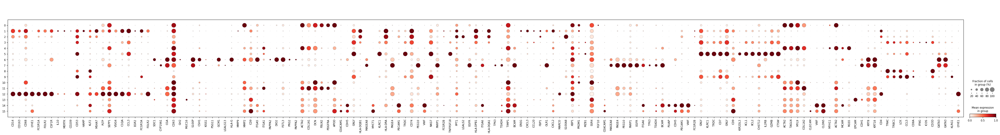

In [31]:
# Visualize the Dotplot for the top marker genes across clusters
sc.pl.dotplot(
    adata,
    var_names=marker_panel_filtered,
    groupby=cluster_key,  # Ensure this matches the column name for your clusters (e.g., 'leiden')
    use_raw=False,  # Set to False if using normalized data
    standard_scale="var",  # Standardize the expression by gene
)


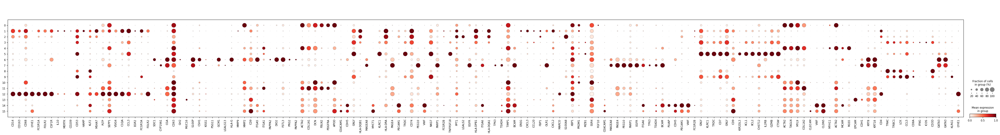

In [32]:
# Visualize the Dotplot for the top marker genes across clusters
sc.pl.dotplot(
    adata,
    var_names=marker_panel_filtered,
    groupby='leiden',  # Ensure this matches the column name for your clusters (e.g., 'leiden')
    use_raw=True,  
    standard_scale="var", # Standardize the expression by gene
    save="VTdotplot_cluster_marker_expression.svg" 
)


In [ ]:
#sorting from the dotplot and my list
cluster_map = {
    "0": "Fibroblast",
    "1": "???",
    "2": "???",
    "3": "???",
    "4": "???",
    "5": "???",
    "6": "???",
    "7": "CTBs",
    "8": "bb",
    "9": "T-cell",
    "10": "T-cell",
    "11": "???",
    "12": "Hofbauer",
    "13": "???",
    "14": "Endothelial",
    "15": "Lymphatic/Endothelial",
}

In [68]:
# Define the most important markers based on your list
marker_important_panel = [
    "CD14", "CD163", "FOLR2", "CSF1R", "LYVE1",  # Hofbauer Cells (M2)
    "HAMP", "C1QA", "FCGR3A", "CCL3", "EGR2",  # Decidual Macrophages (M1)
    "SDC1", "CYP19A1", "MUC16", "GCM1", "LGALS13",  # Syncytiotrophoblasts (STB)
    "HLA-G", "MMP9", "MMP2", "CD9", "PAPPA2",  # EVTs
    "ACTA2", "COL1A1", "VCAM", "DCN", "FBLN2",  # Fibroblasts
    "GNLY", "FCGR2B", "CD74", "VWF", "NKG7",  # Myeloid-Derived Immune Cells
    "FGF10", "Cytokeratin-17", "MAGEA8", "PAGE4", "EGFR",  # Cytotrophoblasts (CTB)
    "CD31", "VWF", "PLVAP", "PECAM1", "FCGR2B",  # Endothelial Cells
    "CD56", "GNLY", "KLRC1", "TRDC",  # Decidual NK (dNK) Cells
    "CD56", "CD161", "CD57",  # CD16+ NK Cells
    "CD103", "CD49a", "KIR2DL3", "XCL1", "IL2RB",  # Decidua Stromal (dS2/dS3)
    "ACTA2", "TAGLN", "COL1A2",  # Non-Decidualized Stroma (dS1)
    "CLEC4M", "VWF", "CLDN5", "RGS5", "ACTA2",  # Perivascular Cells
    "EPCAM", "CDH1", "KRT8", "KRT18",  # Epithelial Cells
    "CD4", "CD8+", "TRAC", "TRBC1", "CCL5",  # T Cells
    "CD127", "GATA3", "CRTH2", "CD90", "LYVE1"  # Innate Lymphoid Cells
]

# Flatten the dictionary into a list of important genes
marker_panel_filtered2 = [gene for genes in marker_panel_important.values() for gene in genes]


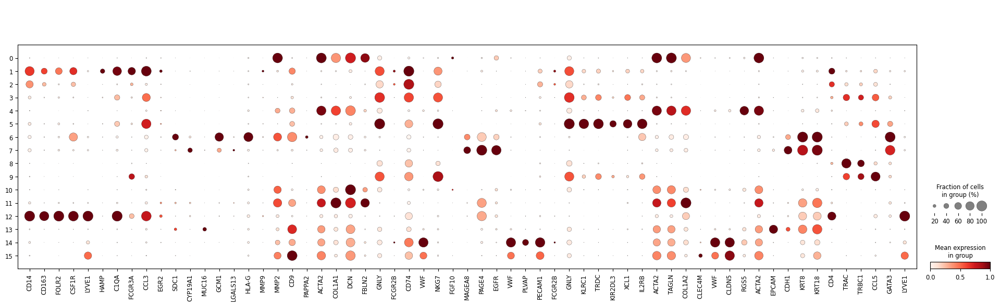

In [72]:
#List of missing genes from the dataset
missing_genes = ['CD103', 'CD127', 'CD161', 'CD31', 'CD49a', 'CD56', 'CD57', 'CD8+', 'CD90', 'CRTH2', 'Cytokeratin-17', 'VCAM']

# Define the marker genes panel (make sure to include the appropriate genes)
marker_important_panel = [
    "CD14", "CD163", "FOLR2", "CSF1R", "LYVE1",  # Hofbauer Cells (M2)
    "HAMP", "C1QA", "FCGR3A", "CCL3", "EGR2",  # Decidual Macrophages (M1)
    "SDC1", "CYP19A1", "MUC16", "GCM1", "LGALS13",  # Syncytiotrophoblasts (STB)
    "HLA-G", "MMP9", "MMP2", "CD9", "PAPPA2",  # EVTs
    "ACTA2", "COL1A1", "VCAM", "DCN", "FBLN2",  # Fibroblasts
    "GNLY", "FCGR2B", "CD74", "VWF", "NKG7",  # Myeloid-Derived Immune Cells
    "FGF10", "Cytokeratin-17", "MAGEA8", "PAGE4", "EGFR",  # Cytotrophoblasts (CTB)
    "CD31", "VWF", "PLVAP", "PECAM1", "FCGR2B",  # Endothelial Cells
    "CD56", "GNLY", "KLRC1", "TRDC",  # Decidual NK (dNK) Cells
    "CD56", "CD161", "CD57",  # CD16+ NK Cells
    "CD103", "CD49a", "KIR2DL3", "XCL1", "IL2RB",  # Decidua Stromal (dS2/dS3)
    "ACTA2", "TAGLN", "COL1A2",  # Non-Decidualized Stroma (dS1)
    "CLEC4M", "VWF", "CLDN5", "RGS5", "ACTA2",  # Perivascular Cells
    "EPCAM", "CDH1", "KRT8", "KRT18",  # Epithelial Cells
    "CD4", "CD8+", "TRAC", "TRBC1", "CCL5",  # T Cells
    "CD127", "GATA3", "CRTH2", "CD90", "LYVE1"  # Innate Lymphoid Cells
]


# Filter out the missing genes
marker_panel_filtered2 = [gene for gene in marker_important_panel if gene not in missing_genes]
#marker_panel_filtered = [gene for gene in marker_panel if gene not in missing_genes]

sc.pl.dotplot(
    adata,
    var_names=marker_panel_filtered2,
    groupby='leiden',  # Ensure this matches the column name for your clusters (e.g., 'leiden')
    use_raw=False,  # Set to False if using normalized data
    standard_scale="var",  # Standardize the expression by gene
)

In [ ]:
#sorting from the dotplot and my list
cluster_map = {
    "0": " ??",
    "1": "Dedicualised macrophages",
    "2": "???",
    "3": "???",
    "4": "???",
    "5": "???",
    "6": "???",
    "7": "??",
    "8": "bb",
    "9": "T-cell",
    "10": "T-cell",
    "11": "???",
    "12": "Hofbauer",
    "13": "???",
    "14": "??",
    "15": "??",
}

In [7]:
#marker gene list i compiled from Cellmarker2.0, human protein atlas and goggle.. T
#The csv file is in my OneDrive should i need it titled "My_VentoTormo_markers_Cellmarker2.0_human protein atlas.xlsx
Markers = {
    "Hofbauer Cells (M2)": ["CD14", "CD163", "CD68", "LYVE1", "FCGR1A", "FOLR2", "CSF1R", "FR-Beta", "IL10", "CD11b", "MERTK", "CD209", "CD53"],
    "Decidual Macrophages (M1)": ["HAMP", "KLF2", "MS4A7", "PLTP", "SEPP1", "VSIG4", "C1QA", "CCL3", "EGR2", "FCGR3A", "FOLR2"],
    "Syncytiotrophoblasts (STB)": ["SDC1", "CYP19A1", "CGA", "CD63", "GH2", "MUC16", "S100P", "CSH1", "KISS1", "PSG11", "ERVWE1", "GCM1", "LGALS13"],
    "EVTs": ["HLA-G", "MMP9", "MMP2", "CD9", "ITGA5", "ITGA1", "PAPPA2", "DIO2", "FSTL3", "PRG2", "PAPPA2"],
    "Fibroblasts": ["ACTA2", "Integrin a1b1", "COL1A1", "DCN", "FBLN2", "PDGFRA", "APOD", "VCAM"],
    "Myeloid-Derived Immune Cells": [
        "CEACAM1", "CDH5", "GNLY", "HLA-DQB1", "MAGEA8", "MYCT1", "KLRC1", "HLA-DRA", "PAGE4", "PECAM1", "TRDC", "CD74", #
        "PEG10", "VWF", "NKG7", "CDVL", "PARP1", "FCGR2B", "TNFRSF18", "PPT1", "LGALS2", "EGFR", "HLA-DPB1", "ITGA6", "HLA-DQA1", 
        "TP63", "TEAD4", "TIMP1", "BCAM", "EREG", "ILIB", "CXCL3", "CCL20", "FBP1", "OLR1", "CXCL2", "MARCO", "S100A8",  # Dendritic
        "XBP1", "PRDM1", "CD138", "MZB1", "SSR4"  # Plasma Cells
    ],
    "Cytotrophoblasts (CTB)": ["FGF10", "Cytokeratin-17", "CEACAM1", "MAGEA8", "PAGE4", "PEG10", "PARP1", "EGFR", "ITGA6", "TP63", "TEAD4", "BCAM"],
    "Endothelial Cells": ["PLVAP", "CD31", "CDH5", "PECAM1", "VWF", "FCGR2B"],
    "Decidual NK (dNK) Cells": ["CD56", "GNLY", "KLRC1", "TRDC"],
    "CD16+ NK Cells": ["CD56", "CD161", "CD57"],
    "Decidua Stromal (dS2/dS3)": ["CD56", "CD7", "GNLY", "CD9", "CD49a", "CD103", "Cd160-", "KIR2DL3", "XCL1", "XCL2", "CHST12", "IL2RB", "GZMB", "CTSW"],
    "Non-Decidualized Stroma (dS1)": ["ACTA2", "TAGLN", "MYL9", "COL1A2"],
    "Perivascular Cells": ["CLEC4M", "VWF", "CLDN5", "MYH11", "ACTA2", "MCAM", "RGS5"],
    "Epithelial Cells": ["EPCAM", "CDH1", "KRT8", "KRT18"],
    "T Cells": ["CD4", "CD8+", "CD69+", "TRAC", "TRBC1", "LCK", "CCL5", "CD8A", "QZMK", "IFNG", "ICOS", "CD3D"],
    "Innate Lymphoid Cells": ["CD127", "GATA-3", "CRTH2", "CD90", "CD45", "ILC1", "GATA-3", "KLRG1", "CD278", "LYVE1"]
}


In [ ]:
# Function to annotate clusters using the full list of marker genes
def annotate_clusters_full(top_genes_long, expanded_markers):
    annotations = {}
    
    # Iterate over each cluster in the dataset
    for cluster in top_genes_long['Cluster'].unique():
        annotations[cluster] = []
        
        # Get the top genes for this cluster
        cluster_genes = top_genes_long[top_genes_long['Cluster'] == cluster]['Gene'].values
        
        # Check if any of the top genes match known markers for each cell type
        for cell_type, marker_list in expanded_markers.items():
            # If any gene in the cluster matches the markers, annotate it
            if any(gene in cluster_genes for gene in marker_list):
                annotations[cluster].append(cell_type)
    
    return annotations

# Annotate the clusters with the full list of markers
annotations = annotate_clusters_full(top_genes_long, expanded_markers)

# Display the annotations for each cluster
for cluster, cell_types in annotations.items():
    print(f"Cluster {cluster}: {', '.join(cell_types)}")


### Published Literature Annotation from Github

In [ ]:
#vento tormo marker genes from their lab code on Github
marker_genes = {
    'Mesenchymal lineage': {"PDGFRA", 'OGN','DCN', 'LUM'},
#     'Mesenchymal stem cells':{'NANOG', 'POU5F1'},
    'eS':{'MMP11', 'CRABP2',  'KLK1', 'TUNAR', 'SFRP1', 'FOXL2', 'TGFBI', 'F13A1'}, #'ECM1',
    'eS MMPs':{'CEMIP', 'INHBA', 'MMP10','MMP3', 'MMP1', 'COL8A1', 'BMP2', 'STC1'},
    'eS-dS/P4-induced':{'CILP', 'CALB2', 'PCSK6', 'RND2', 'NTRK3'},
    'dS':{'C3', 'DKK1', 'IL15', 'PALMD', 'CFD',  'TMEM37', 'LMCD1', 'PLA2G2A',  'IL15', 'PAEP'},     
    'dS mid':{'SCGB2A1', 'SCGB1D2', 'CXCL13', 'GABRA2', 'TLR4'},
    'dS late':{'SMAD7',  'GNG4','CXCL8', 'CXCL2', 'IGFBP1', 'TRIB1',  'TNFAIP3', 'TNFAIP2'},     
    'dS menstrual':{'SIGLEC7', 'PRL', 'HSD11B1', 'CRLF1', 'CFH'},
    'dS other':{'HBEGF', 'FOSL1', 'EGR3', 'BACH2',  'FGFR1',  'NFATC2'},  
#     'dS CRISP3':{'CRISP3', 'SLPI'},
    'PV lineage':{'MYH11', 'ACTA2', "MCAM", 'RGS5'},
    'ePV':{'ADGRF5'},
    'ePV STEAP4':{'STEAP4', 'ARHGAP15', 'SSTR2', 'SMTNL2'},
    'ePV MMP11':{'MMP11', 'TDO2', 'LPL', 'CYGB', 'SUSD2'},
    "ePV AOC3":{'AOC3', 'SLC38A11', 'CCND1', 'OR51E1' , 'MYOM2', 'FNDC1', 'NTRK2', 'NET1', 'MAP3K7CL', 'NRARP', 'STC2'},
    'mPV MYH11':{'RERGL', 'KCNAB1', 'NTRK2', 'FHL5'},
    'PV lessions CCL19':{'CCL19'},
    'Fibroblast C7': {'C7', 'SCN7A', 'PTGIS'},
    'vascularSMCs':{'SBSPON', 'IGFBP5'},
    'uSMCs':{'LEFTY2', 'ACTG2', 'ITGA11', 'DES', 'PCP4', 'PTGER2', 'PTGER3'},
    'HOXA13':{'CXCL14', 'PGF', 'BMP7', 'HOXA13'},
    'non-vascularSMCs':{'AREG', 'P2RY14'},
    'Epithelial lineage': {'EPCAM', 'PAX8'},
    'Endothelial': {'PECAM1', 'VWF', 'CDH5'},
    'Immune': {'PTPRC'},
    'Lymphoid': {'CD3D', 'NCAM1' , 'NKG7'},
    'Myeloid': {'CSF1R', 'CD14'},
#     'MUC5B+':{"MUC5B", "STRA6", "LTF", "BPIFB1"},
#     'KRT5/TP63':{'KRT5', 'TP63', 'SNCG'},
    'WIF1':{'WIF1'},
    'P4 withdrawal':{'PTGS2', 'CCL2', 'CXCL8'},
#     'Prostaglandin R':{'PTGER4','PTGFR', 'PTGER3', 'PTGIR', 'PTGDR', 'PTGDR2', 'PTGER1', 'PTGER2'},
#     'Prostaglandin S':{ 'PTGES', 'HPGDS', 'PTGS1', 'TBXAS1', 'PTGS2', 'PTGDS', 'PLA2G4A', 'PTGES3', 'PTGIS', 'PTGES2'},
    'HOXA':{'HOXA9', 'HOXA10', 'HOXA11', 'HOXA13', 'HOXD9', 'HOXD10', 'HOXD10', "HOXC4", "HOXC6", "HOXD11"},
    'dS Inflamatory':{"IL15"},
    'MUC5B': {'MUC5B'},
    'lowQC': {"HBA1", "HBA2"}
}

marker_genes_short = {
    'Epithelial lineage': {'EPCAM', 'PAX8'},    
#     'Mesothelial': {'UPK3B', 'LRRN4'},
    'Mesenchymal lineage': {"PDGFRA", 'OGN'}, # 'DCN', 'LUM'
    'PV lineage':{'MYH11', 'ACTA2', "MCAM"},
    'uSMCs':{'LEFTY2', 'ACTG2', 'ITGA11'},
    'Endothelial': {'PECAM1', 'VWF', 'CDH5'},
    'Immune': {'PTPRC'},
    'Lymphoid': {'CD3D', 'NCAM1' , 'NKG7'},
    'Myeloid': {'CSF1R', 'CD14'},
    'Erythroid': {"HBB", "HBA1"}
}

In [ ]:
# vento tormo lab markers for main endometrial cell lineages as used in the HECA

lineage_markers = {"Endothelial" : {"CDH5", "VWF"},
                  "Epithelial" : {"EPCAM", "PAX8"},
                  "Immune" : {"PTPRC", "CD3D", "NKG7", "CSF1R"},
                  "Mensechymal" : {"PCOLCE", "DCN", "COL1A1"}}

lineage_markers = filter_genes(lineage_markers)

# visualise main endometrial cell lineage markers per cluster in the query dataset
sc.pl.dotplot(query_adata, lineage_markers, groupby = "leiden", standard_scale = "var" )

# assign cell lineages based on marker gene expression

cluster_lineage = {"Endothelial" : ["1"],
                  "Epithelial" : ["7", "8", "14", "15", "16", "17", "18", "22"],
                  "Immune" : ["9", "12", "19", "24", "25"],
                  "Mesenchymal" : ["0", "2", "3", "4", "5", "6", "10", "11", "13", "20", "21", "23"], 
                  "Doublets" : ["20"]}

In [ ]:
#vento tormo placentainfec tion marker genes from github
marker_genes = ['CD3G', #T cells
                'IL7R', 'CD4', # CD4 T cells
                 'CD8A', 'CD8B', #CD8 t cells
                
                'CD19', 'MS4A1', #B cells
                
                'S100A8',#monocytes
                'LYZ', 'CD14', # CD14 monocytes
                'FCGR3A', 'MS4A7', # CD16+ monocytes
                
                 
                'GNLY', 'NKG7', 'KLRB1', #NK Cells
                
                
                'FCER1A', 'CST3', #DCs
                
                'PPBP', #megakaryocytes,
                "HBA1",
                'leiden']